# 목차

#### 1. EDA (Exploratory Data Analysis)
#### 2. 전처리 및 특성공학
#### 3. 모델링 및 하이퍼파라미터 튜닝
#### 4. 분류성능지표
#### 5. 프로젝트 요약

#### 이 데이터셋은 신용카드 회사의 고객 정보를 포함하고 있습니다. 각 행에는 고객 ID와 나이, 연봉, 결혼 여부, 신용카드 한도, 신용카드 카테고리 등과 같은 다양한 특성이 포함되어 있습니다.

#### 이 프로젝트의 목표는 회사의 신용카드 사용자의 특성 및 소비 형태 등을 모델로 분석하여 미래에 이탈할 고객들을 예측하여, 기업이 마케팅 전략을 맞춤화하고 제품 제공을 최적화할 수 있도록 하는 것입니다.


----

In [1]:
# 주요 페키지 정리
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from plotly.subplots import make_subplots
import plotly.graph_objs as go
import statsmodels.api as sm
import seaborn as sns
import matplotlib as mpl
from sklearn.impute import SimpleImputer
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.impute import KNNImputer
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, MinMaxScaler, PowerTransformer
from sklearn.decomposition import PCA
from collections import Counter
from sklearn.model_selection import cross_val_score, KFold, GridSearchCV
from imblearn.pipeline import Pipeline, make_pipeline
from imblearn.over_sampling import SMOTE
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.metrics import roc_curve, auc, roc_auc_score

## 1. EDA (Exploratory Data Analysis)
#### 데이터의 이해 및 이상치와 변수 간의 관계 파악

In [2]:
# 데이터 읽기
df = pd.read_csv("data/BankChurners.csv")
df.drop(df.columns[0], axis=1, inplace=True)
df.drop(df.columns[-2:], axis=1, inplace=True)
df.head(1)

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,5,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061


In [3]:
# 데이터 컬럼 확인
column_names = df.columns.tolist()
column_names

['Attrition_Flag',
 'Customer_Age',
 'Gender',
 'Dependent_count',
 'Education_Level',
 'Marital_Status',
 'Income_Category',
 'Card_Category',
 'Months_on_book',
 'Total_Relationship_Count',
 'Months_Inactive_12_mon',
 'Contacts_Count_12_mon',
 'Credit_Limit',
 'Total_Revolving_Bal',
 'Avg_Open_To_Buy',
 'Total_Amt_Chng_Q4_Q1',
 'Total_Trans_Amt',
 'Total_Trans_Ct',
 'Total_Ct_Chng_Q4_Q1',
 'Avg_Utilization_Ratio']

In [4]:
# 데이터 구조 및 정보 확인
print(' 데이터의 구조')
print(df.shape)
print('\n 데이터의 정보')
df.info()

 데이터의 구조
(10127, 20)

 데이터의 정보
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 20 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Attrition_Flag            10127 non-null  object 
 1   Customer_Age              10127 non-null  int64  
 2   Gender                    10127 non-null  object 
 3   Dependent_count           10127 non-null  int64  
 4   Education_Level           10127 non-null  object 
 5   Marital_Status            10127 non-null  object 
 6   Income_Category           10127 non-null  object 
 7   Card_Category             10127 non-null  object 
 8   Months_on_book            10127 non-null  int64  
 9   Total_Relationship_Count  10127 non-null  int64  
 10  Months_Inactive_12_mon    10127 non-null  int64  
 11  Contacts_Count_12_mon     10127 non-null  int64  
 12  Credit_Limit              10127 non-null  float64
 13  Total_Revolving_Bal       1012

#### 1) 범주형 데이터 확인

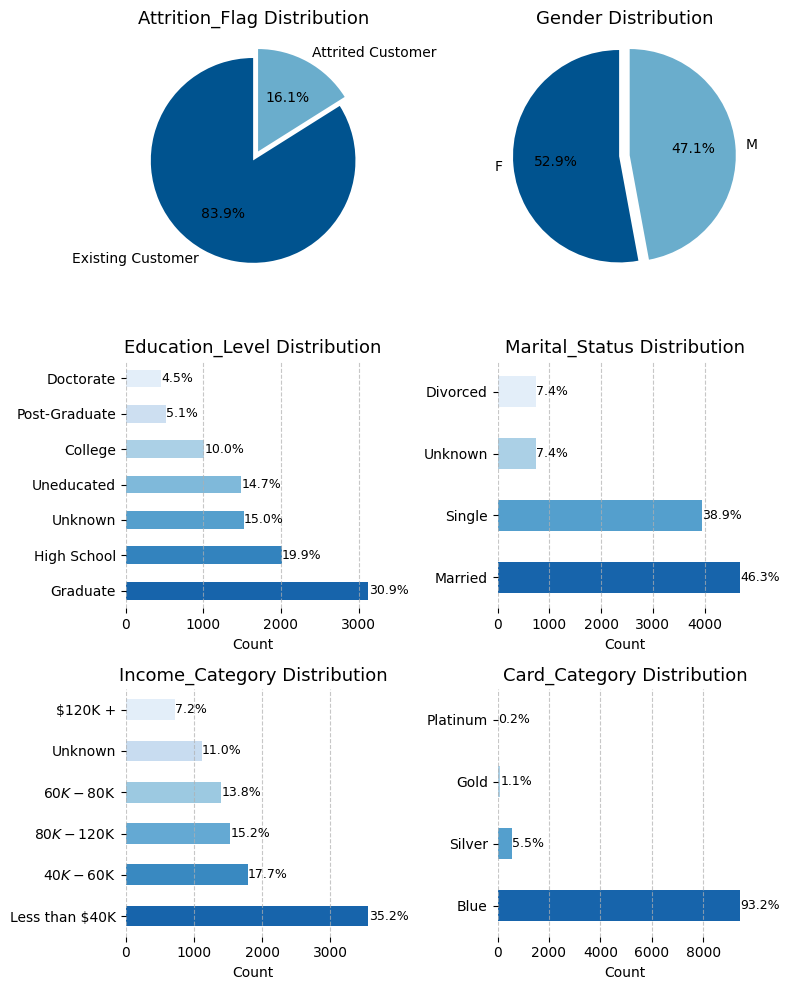

In [5]:
# 범주형 데이터
categ = df.select_dtypes(include=['object']).columns

# 시각화 함수 정의
def visualize_category(df, category):
    if df[category].nunique() <= 2:  # 범주가 2개 이하인 경우 파이차트
        explode = (0.1, 0)
        df[category].value_counts().plot(kind='pie', autopct='%1.1f%%', startangle=90, colors=['#00538F', '#6AADCC'], explode=explode)
        plt.axis('equal')
    else:  # 범주가 3개 이상인 경우 옆으로 누운 막대그래프
        value_counts = df[category].value_counts()
        
        # 색상 맵 설정
        color_map = plt.cm.get_cmap('Blues')
        colors = color_map(np.linspace(0.8, 0.1, len(value_counts)))
        
        ax = value_counts.plot(kind='barh', color=colors)
        plt.xlabel('Count')

        # 각 막대별 퍼센트 추가
        for i, v in enumerate(value_counts):
            ax.text(v + 3, i, f"{v / len(df) * 100:.1f}%", color='black', va='center', fontsize=9)

    plt.ylabel('')
    plt.title(f'{category} Distribution', fontsize=13)
    plt.xticks(fontsize=10, color='black')
    plt.yticks(fontsize=10, color='black')
    plt.box(False)
    plt.grid(axis='x', linestyle='--', alpha=0.7)
    plt.tight_layout()

# 하나의 figure에 모든 시각화 표시
plt.figure(figsize=(8, 10))
plt.subplots_adjust(wspace=0.2, hspace=0.2)
for idx, category in enumerate(categ, 1):
    plt.subplot(3, 2, idx)
    visualize_category(df, category)

plt.show()

#### **평가**
 1. 데이터 정보 확인상 결측치는 발견되지 않았으나, Education_Level (교육 수준), Marital_Status (혼인 여부), Income_Category (수입 구분)에서 "Unknown" 데이터 확인
2. 고객들의 Gender (성별)은 균형이 맞지만, Attrition_Flag (해지 여부)의 데이터는 83.9% 대 16.1%로 불균형이 심하게 난다.
3. Income_Category (수입 구분)에서 대부분의 고객들은 $40,000 이하의 수입을 얻는 것으로 확인
4. Card_Category (카드 구분)에서 대부분의 고객들은 블루 카드를 소지하는 것으로 확인

#### 2) 수치형 데이터 확인

In [6]:
# 전체 데이터프레임에서 수치형 열만 선택
numeric_columns = df.select_dtypes(include=['number'])

# 각 수치형 열에 대해 상자 그림(Box Plot)과 히스토그램(Histogram)을 묶어서 표시
for col in numeric_columns.columns:
    # 새로운 subplot 생성
    fig = make_subplots(rows=2, cols=1, shared_xaxes=True)

    # 상자 그림(Box Plot) 추가
    fig.add_trace(go.Box(x=df[col], name=f'{col} Box Plot', boxmean=True), row=1, col=1)

    # 히스토그램(Histogram) 추가
    fig.add_trace(go.Histogram(x=df[col], name=f'{col} Histogram'), row=2, col=1)

    # 레이아웃 설정
    fig.update_layout(title=f'Distribution of {col}', height=400, width = 1000)

    # 플롯 표시
    fig.show()


----

## 2. 전처리 및 특성공학
#### "Unknown" 결측치 데이터를 처리하여 데이터를 총 5가지로 나눠서 모델링을 진행하고자한다.
|데이터프레임|df1|df2|df3|df4|df5|
|-|-|-|-|-|-|
|방법|최빈값 |완전삭제|Hot-Deck|Knn기법|결측값사용|
|데이터 수|10,127|7,081|10,127|10,127|10,127|

#### 1) 최빈값
Unknown 데이터를 각각 3개의 범주형 컬럼 ('Education_Level', 'Marital_Status', 'Income_Category' )에 있는 가장 많이있는 값으로 대체

In [7]:
# df1 (최빈값)
df1 = df.copy()

# "Unknown" 값을 NaN으로 대체
df1.replace("Unknown", np.nan, inplace=True)

# 결측값을 대체할 SimpleImputer 객체 생성
imputer = SimpleImputer(strategy='most_frequent')

# 대체할 열 선택
columns_to_impute = ['Education_Level', 'Marital_Status', 'Income_Category']

# 선택한 열의 결측값 대체
df1[columns_to_impute] = imputer.fit_transform(df1[columns_to_impute])

#### 2) 완전삭제
Unknown 데이터를 완전히 삭제

In [8]:
# df2 (완전삭제)
df2 = df.copy()

# "Unknown" 값을 NaN으로 대체
df2.replace("Unknown", np.nan, inplace=True)

# 결측치가 있는 모든 행 삭제
df2.dropna(axis=0, inplace=True)

#### 3) Hot-dect 대체
Unknown 대상 변수와 유사성을 가지는 행을 찾아, 결측값을 대체

In [9]:
# df3 (Hot-deck 유사성으로 대체하기)
df3 = df.copy()

# "Unknown" 값을 NaN으로 대체
df3.replace("Unknown", np.nan, inplace=True)

# 결측값 대체 함수 정의
def replace_missing_with_similarity(df3, target_col, sim_cols):
    for index, row in df3.iterrows():
        if pd.isna(row[target_col]):
            # 결측값을 가진 행과 유사한 행 찾기
            similar_rows = df3
            for col in sim_cols:
                similar_rows = similar_rows[similar_rows[col] == row[col]]
            similar_rows = similar_rows[~similar_rows[target_col].isna()]
            
            # 유사한 행들 중에서 대체값 선택
            if not similar_rows.empty:
                replacement_values = similar_rows[target_col].mode()
                if not replacement_values.empty:
                    replacement_value = replacement_values.iloc[0]
                    df3.at[index, target_col] = replacement_value

# 대상 변수와 유사성 비교에 사용할 변수 선택
target_cols1 = ['Education_Level']
sim_cols_list1 = [
    ['Customer_Age', 'Gender', 'Income_Category', 'Credit_Limit'],
    ['Customer_Age', 'Gender', 'Marital_Status'],
    ['Customer_Age', 'Gender', 'Dependent_count'],
    ['Customer_Age', 'Gender', 'Months_on_book'],
    ['Customer_Age', 'Gender', 'Card_Category'],
]

target_cols2 = ['Marital_Status']
sim_cols_list2 = [
    ['Customer_Age', 'Income_Category', 'Credit_Limit'],
    ['Customer_Age', 'Dependent_count', 'Total_Relationship_Count', 'Months_on_book'],
    ['Customer_Age', 'Dependent_count']
]

target_cols3 = ['Income_Category']
sim_cols_list3 = [
    ['Customer_Age', 'Gender', 'Education_Level', 'Credit_Limit', 'Card_Category'],
    ['Customer_Age', 'Gender', 'Education_Level'],
    ['Customer_Age', 'Gender', 'Marital_Status']
]

# 결측값 대체 함수 호출
for target_col in target_cols1:
    for sim_cols in sim_cols_list1:
        replace_missing_with_similarity(df3, target_col, sim_cols)
for target_col in target_cols2:
    for sim_cols in sim_cols_list2:
        replace_missing_with_similarity(df3, target_col, sim_cols)
for target_col in target_cols3:
    for sim_cols in sim_cols_list3:
        replace_missing_with_similarity(df3, target_col, sim_cols)

#### 4) KNN 기법
인접 이웃 수의 가중 또는 가중 평균을 사용하여 Unknown 값을 대체

In [10]:
# df4 (KNN 기법)
df4 = df.copy()

# "Unknown" 값을 NaN으로 대체
df4.replace("Unknown", np.nan, inplace=True)

df4['Education_Level'] = df4['Education_Level'].map({'Uneducated':1, 'High School':2, 'College':3, 
                                                'Graduate':4, 'Post-Graduate':5, 'Doctorate':6})
df4['Income_Category'] = df4['Income_Category'].map({'Less than $40K':1, '$40K - $60K':2, '$60K - $80K':3, 
                                                '$80K - $120K':4, '$120K +':5})
df4['Card_Category'] = df4['Card_Category'].map({'Blue':1, 'Silver':2, 'Gold':3, 'Platinum':4})
df4['Gender'] = df4['Gender'].map({'M':1, 'F':0})
df4['Marital_Status'] = df4['Marital_Status'].map({'Unknown': 0, 'Single': 1, 'Married':2, 'Divorced':3})
df4['Attrition_Flag'] = df4['Attrition_Flag'].map({'Existing Customer':1, 'Attrited Customer':0})

# 결측치를 KNNImputer로 대체
imputer = KNNImputer(n_neighbors=10)
df4 = pd.DataFrame(imputer.fit_transform(df4), columns=df4.columns)

#### 5) Unknown 데이터 사용
Unknown 데이터를 삭제하지 않고 남겨서 사용

In [11]:
# df5 (Unknown 데이터 사용)
df5 = df.copy()

#### 인코딩
#### - 모델을 사용하기 위해 범주형 데이터 인코딩 진행

In [12]:
# df1부터 df3까지의 데이터프레임에 대해 순서형(Ordinal) 인코딩 적용
dfs = [df1, df2, df3]
for i, df in enumerate(dfs, start=1):
    df['Education_Level'] = df['Education_Level'].map({'Uneducated':1, 'High School':2, 'College':3, 
                                                       'Graduate':4, 'Post-Graduate':5, 'Doctorate':6})
    df['Income_Category'] = df['Income_Category'].map({'Less than $40K':1, '$40K - $60K':2, '$60K - $80K':3, 
                                                       '$80K - $120K':4, '$120K +':5})
    df['Card_Category'] = df['Card_Category'].map({'Blue':1, 'Silver':2, 'Gold':3, 'Platinum':4})

    df['Gender'] = df['Gender'].map({'M':1, 'F':0})
    df['Marital_Status'] = df['Marital_Status'].map({'Single': 1, 'Married':2, 'Divorced':3})
    df['Attrition_Flag'] = df['Attrition_Flag'].map({'Existing Customer':1, 'Attrited Customer':0})
    
    globals()[f'df{i}'] = df

In [13]:
df5['Education_Level'] = df5['Education_Level'].map({'Unknown':0, 'Uneducated':1, 'High School':2, 'College':3, 
                                                                 'Graduate':4, 'Post-Graduate':5, 'Doctorate':6})
df5['Income_Category'] = df5['Income_Category'].map({'Unknown':0, 'Less than $40K':1, '$40K - $60K':2, '$60K - $80K':3, 
                                                                 '$80K - $120K':4, '$120K +':5})
df5['Card_Category'] = df5['Card_Category'].map({'Blue':1, 'Silver':2, 'Gold':3, 'Platinum':4})
df5['Gender'] = df5['Gender'].map({'M':1, 'F':0})
df5['Marital_Status'] = df5['Marital_Status'].map({'Unknown': 0, 'Single': 1, 'Married':2, 'Divorced':3})
df5['Attrition_Flag'] = df5['Attrition_Flag'].map({'Existing Customer':1, 'Attrited Customer':0})

#### 히트맵 그리기

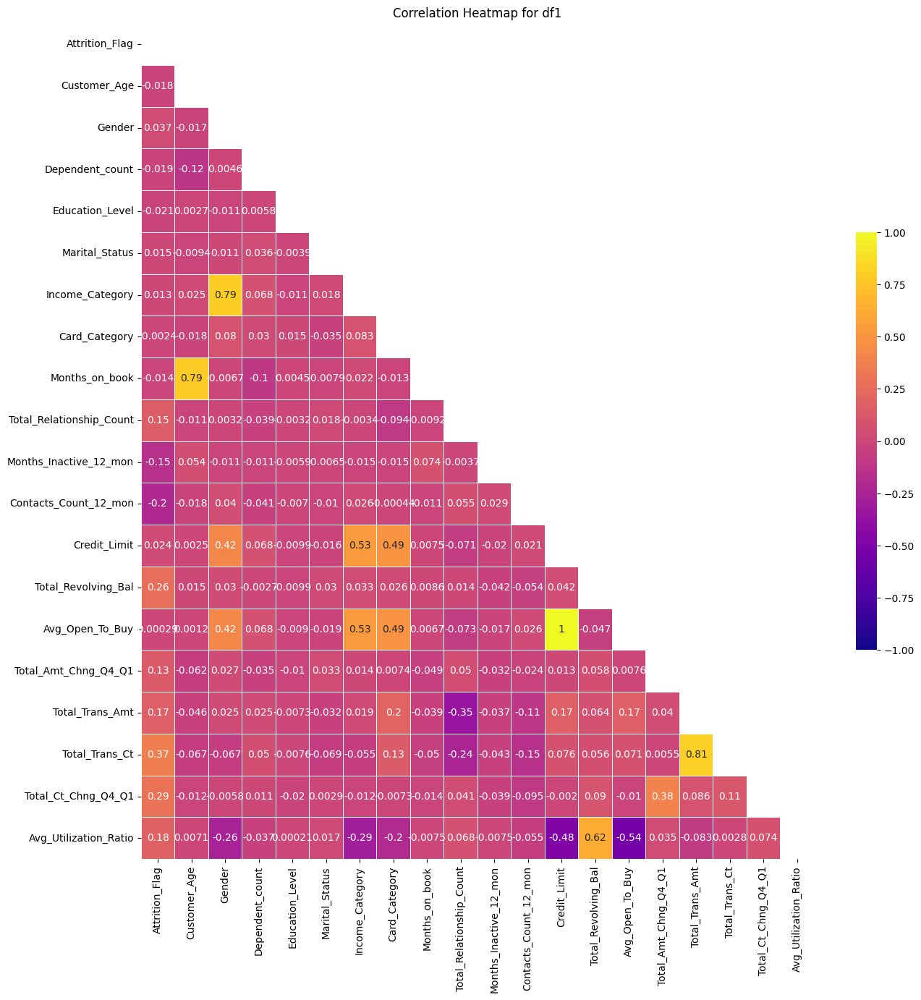

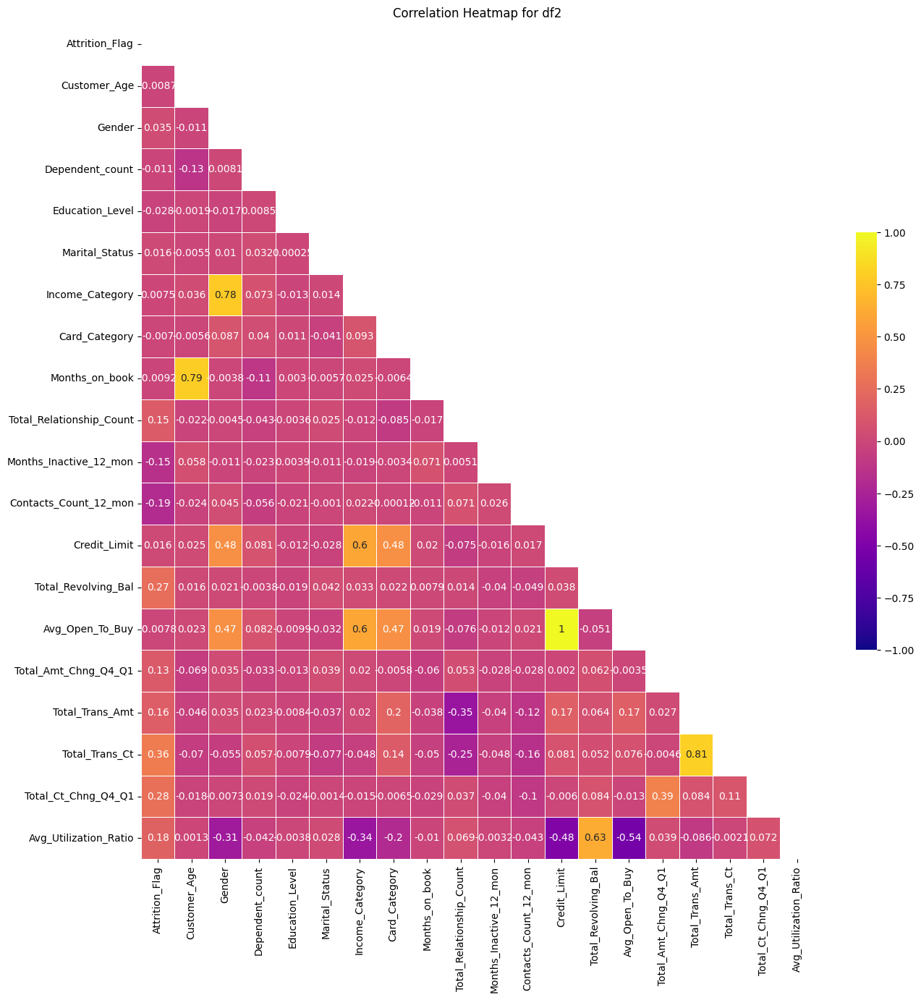

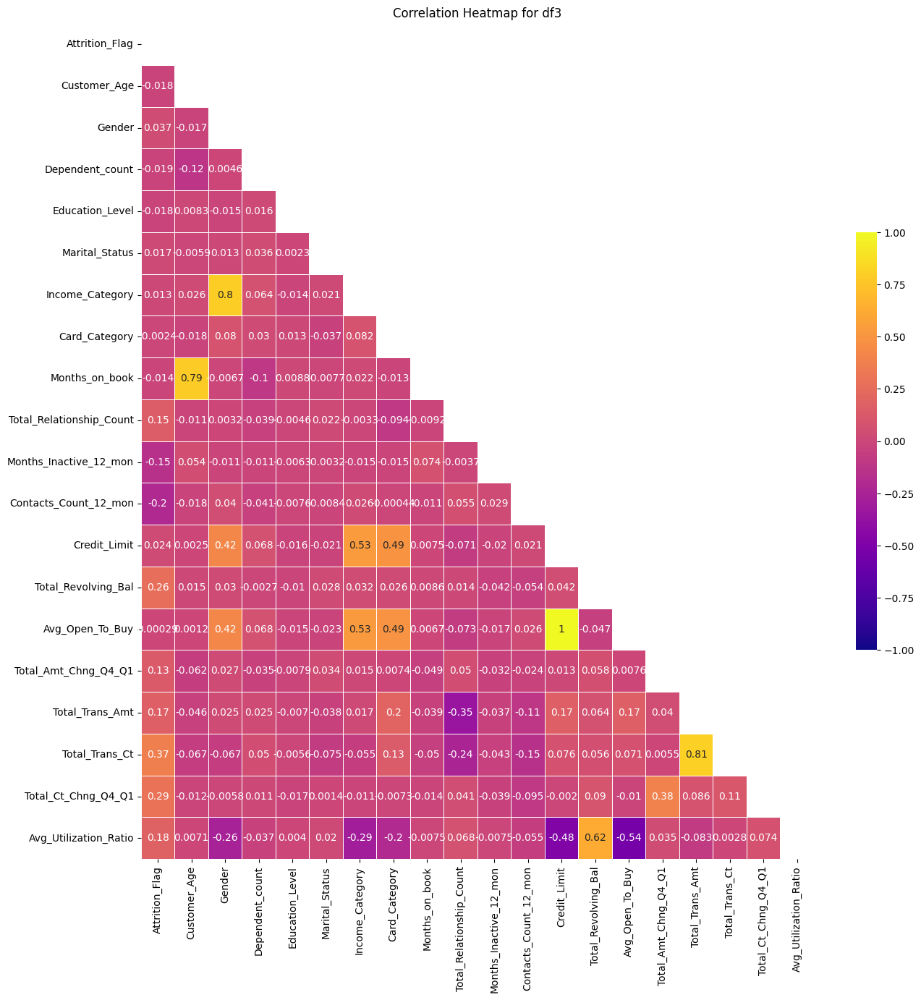

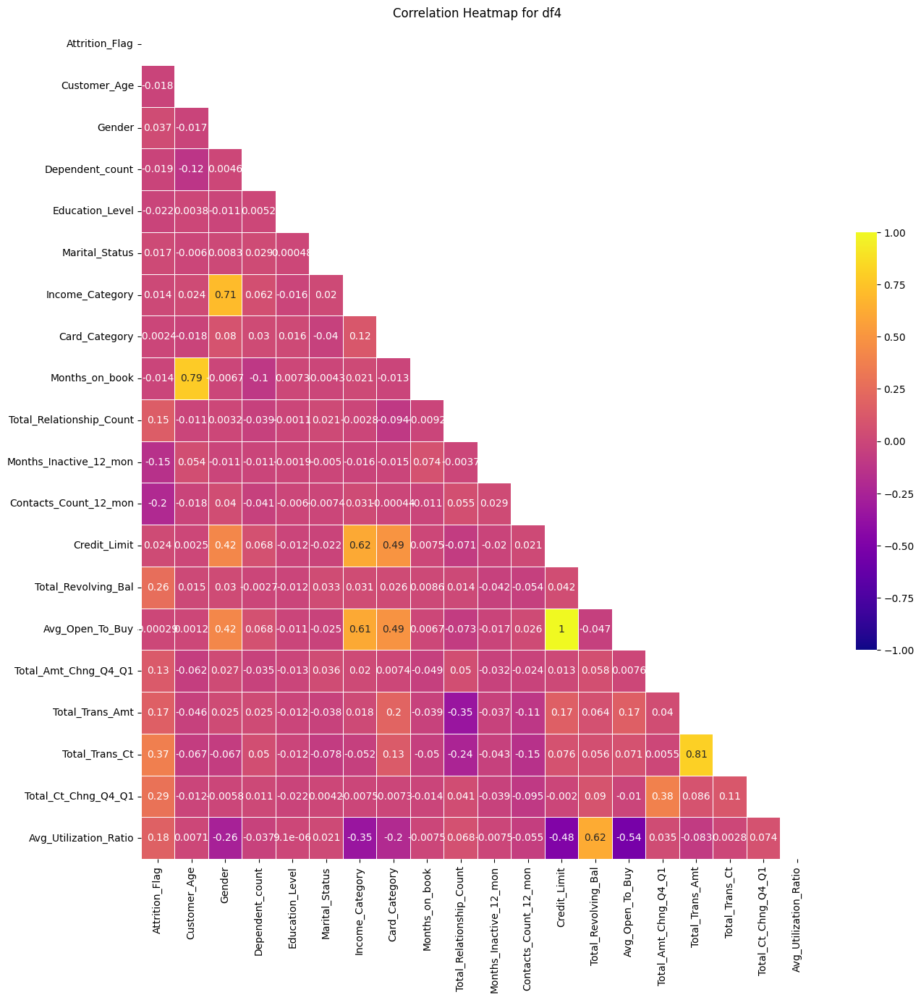

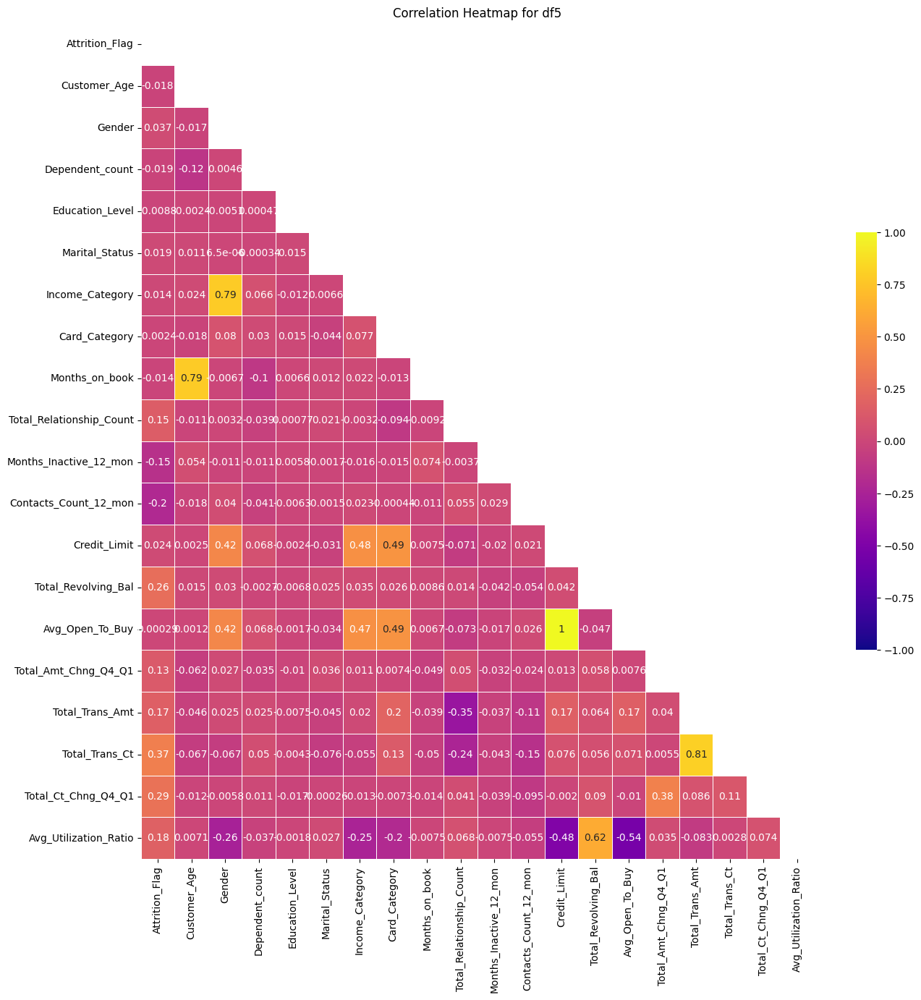

In [14]:
# 각 DataFrame에 대해 상관 히트맵 그리기
for i, df in enumerate([df1, df2, df3, df4, df5], start=1):
    # 상관 행렬 계산
    df_corr = df.corr()
    
    # 그림 사이즈 지정
    fig, ax = plt.subplots(figsize=(15, 15))

    # 삼각형 마스크를 만든다(위 쪽 삼각형에 True, 아래 삼각형에 False)
    mask = np.zeros_like(df_corr, dtype=bool)
    mask[np.triu_indices_from(mask)] = True

    # 히트맵을 그린다
    sns.heatmap(df_corr, 
                cmap='plasma', 
                annot=True,        # 실제 값을 표시한다
                mask=mask,         # 표시하지 않을 마스크 부분을 지정한다
                linewidths=.5,     # 경계면 실선으로 구분하기
                cbar_kws={"shrink": .5},  # 컬러바 크기 절반으로 줄이기
                vmin=-1, vmax=1    # 컬러바 범위 -1 ~ 1
               )  
    plt.title(f"Correlation Heatmap for df{i}")
    plt.show()


#### 평가
df1 ~ df5 높은 상관관계 확인

| 항목                    | 최대 상관관계 | 최소 상관관계 |
|-------------------------|--------------|--------------|
| Avg_Open_To_Buy, Credit_Limit | 1.00         | 1.00         |
| Total_Trans_Ct, Total_Trans_Amt | 0.81         | 0.81         |
| Income_Category, Gender   | 0.80         | 0.71         |
| Months_on_book, Customer_Age | 0.79         | 0.79         |
| Avg_Utilization_Ratio, Total_Revolving_Bal | 0.63         | 0.48         |


#### 다중 공선성 검정
VIF 및 공차를 확인하기

[VIF >10, 공차 (Tolerance) < 0.1]

In [15]:
# VIF 계산 함수
def calculate_vif(X):
    vif_data = pd.DataFrame()
    vif_data["Feature"] = X.columns
    vif_data["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
    return vif_data

# 공차 계산 함수
def calculate_tolerance(vif_data):
    vif_data["Tolerance"] = 1 / vif_data["VIF"]
    return vif_data

# 다중 공선성이 있는 변수 확인 함수
def find_high_vif_variables(vif_data, threshold=10):
    return vif_data[vif_data["VIF"] > threshold]

def find_low_tolerance_variables(vif_data, threshold=0.1):
    return vif_data[vif_data["Tolerance"] < threshold]

# 각 DataFrame에 대해 작업 수행
for i, df in enumerate([df1, df2, df3, df4, df5], start=1):
    print(f"Results for df{i}:")
    
    # 독립 변수와 종속 변수 구분
    X = df.drop("Attrition_Flag", axis=1)
    y = df["Attrition_Flag"]
    
    # VIF 계산 및 다중 공선성 확인
    vif_data = calculate_vif(X)
    vif_data = vif_data.round(2)
    print("VIF:")
    display(vif_data)
    
    print("\nVariables with high VIF:")
    high_vif = find_high_vif_variables(vif_data)
    if not high_vif.empty:
        display(high_vif)
    else:
        print("None")
    
    # 공차 계산 및 다중 공선성 확인
    try:
        vif_data = calculate_tolerance(vif_data)
        vif_data = vif_data.round(2)
        print("\nTolerance:")
        display(vif_data)
        
        print("\nVariables with low tolerance:")
        low_tolerance = find_low_tolerance_variables(vif_data)
        if not low_tolerance.empty:
            display(low_tolerance)
        else:
            print("None")
    except Exception as e:
        print("Error in calculating tolerance:", e)
    print()

Results for df1:
VIF:


/Users/parkyunsu/anaconda3/envs/credit/lib/python3.8/site-packages/statsmodels/stats/outliers_influence.py:198: RuntimeWarning:

divide by zero encountered in scalar divide



,Feature,VIF
0,Customer_Age,79.30
1,Gender,5.22
2,Dependent_count,4.22
3,Education_Level,6.36
4,Marital_Status,8.26
5,Income_Category,11.60
6,Card_Category,14.74
7,Months_on_book,56.45
8,Total_Relationship_Count,7.63
9,Months_Inactive_12_mon,6.16



Variables with high VIF:


,Feature,VIF
0,Customer_Age,79.30
5,Income_Category,11.60
6,Card_Category,14.74
7,Months_on_book,56.45
11,Credit_Limit,inf
12,Total_Revolving_Bal,inf
13,Avg_Open_To_Buy,inf
14,Total_Amt_Chng_Q4_Q1,14.43
16,Total_Trans_Ct,23.81
17,Total_Ct_Chng_Q4_Q1,11.83



Tolerance:


,Feature,VIF,Tolerance
0,Customer_Age,79.30,0.01
1,Gender,5.22,0.19
2,Dependent_count,4.22,0.24
3,Education_Level,6.36,0.16
4,Marital_Status,8.26,0.12
5,Income_Category,11.60,0.09
6,Card_Category,14.74,0.07
7,Months_on_book,56.45,0.02
8,Total_Relationship_Count,7.63,0.13
9,Months_Inactive_12_mon,6.16,0.16



Variables with low tolerance:


,Feature,VIF,Tolerance
0,Customer_Age,79.30,0.01
5,Income_Category,11.60,0.09
6,Card_Category,14.74,0.07
7,Months_on_book,56.45,0.02
11,Credit_Limit,inf,0.00
12,Total_Revolving_Bal,inf,0.00
13,Avg_Open_To_Buy,inf,0.00
14,Total_Amt_Chng_Q4_Q1,14.43,0.07
16,Total_Trans_Ct,23.81,0.04
17,Total_Ct_Chng_Q4_Q1,11.83,0.08



Results for df2:
VIF:


/Users/parkyunsu/anaconda3/envs/credit/lib/python3.8/site-packages/statsmodels/stats/outliers_influence.py:198: RuntimeWarning:

divide by zero encountered in scalar divide



,Feature,VIF
0,Customer_Age,80.17
1,Gender,5.49
2,Dependent_count,4.25
3,Education_Level,5.53
4,Marital_Status,7.80
5,Income_Category,12.70
6,Card_Category,14.95
7,Months_on_book,56.97
8,Total_Relationship_Count,7.74
9,Months_Inactive_12_mon,6.33



Variables with high VIF:


,Feature,VIF
0,Customer_Age,80.17
5,Income_Category,12.70
6,Card_Category,14.95
7,Months_on_book,56.97
11,Credit_Limit,inf
12,Total_Revolving_Bal,inf
13,Avg_Open_To_Buy,inf
14,Total_Amt_Chng_Q4_Q1,14.13
16,Total_Trans_Ct,23.37
17,Total_Ct_Chng_Q4_Q1,11.80



Tolerance:


,Feature,VIF,Tolerance
0,Customer_Age,80.17,0.01
1,Gender,5.49,0.18
2,Dependent_count,4.25,0.24
3,Education_Level,5.53,0.18
4,Marital_Status,7.80,0.13
5,Income_Category,12.70,0.08
6,Card_Category,14.95,0.07
7,Months_on_book,56.97,0.02
8,Total_Relationship_Count,7.74,0.13
9,Months_Inactive_12_mon,6.33,0.16



Variables with low tolerance:


,Feature,VIF,Tolerance
0,Customer_Age,80.17,0.01
5,Income_Category,12.70,0.08
6,Card_Category,14.95,0.07
7,Months_on_book,56.97,0.02
11,Credit_Limit,inf,0.00
12,Total_Revolving_Bal,inf,0.00
13,Avg_Open_To_Buy,inf,0.00
14,Total_Amt_Chng_Q4_Q1,14.13,0.07
16,Total_Trans_Ct,23.37,0.04
17,Total_Ct_Chng_Q4_Q1,11.80,0.08



Results for df3:
VIF:


/Users/parkyunsu/anaconda3/envs/credit/lib/python3.8/site-packages/statsmodels/stats/outliers_influence.py:198: RuntimeWarning:

divide by zero encountered in scalar divide



,Feature,VIF
0,Customer_Age,79.40
1,Gender,5.32
2,Dependent_count,4.22
3,Education_Level,6.18
4,Marital_Status,7.86
5,Income_Category,12.01
6,Card_Category,14.76
7,Months_on_book,56.46
8,Total_Relationship_Count,7.62
9,Months_Inactive_12_mon,6.16



Variables with high VIF:


,Feature,VIF
0,Customer_Age,79.40
5,Income_Category,12.01
6,Card_Category,14.76
7,Months_on_book,56.46
11,Credit_Limit,inf
12,Total_Revolving_Bal,inf
13,Avg_Open_To_Buy,inf
14,Total_Amt_Chng_Q4_Q1,14.43
16,Total_Trans_Ct,23.82
17,Total_Ct_Chng_Q4_Q1,11.83



Tolerance:


,Feature,VIF,Tolerance
0,Customer_Age,79.40,0.01
1,Gender,5.32,0.19
2,Dependent_count,4.22,0.24
3,Education_Level,6.18,0.16
4,Marital_Status,7.86,0.13
5,Income_Category,12.01,0.08
6,Card_Category,14.76,0.07
7,Months_on_book,56.46,0.02
8,Total_Relationship_Count,7.62,0.13
9,Months_Inactive_12_mon,6.16,0.16



Variables with low tolerance:


,Feature,VIF,Tolerance
0,Customer_Age,79.40,0.01
5,Income_Category,12.01,0.08
6,Card_Category,14.76,0.07
7,Months_on_book,56.46,0.02
11,Credit_Limit,inf,0.00
12,Total_Revolving_Bal,inf,0.00
13,Avg_Open_To_Buy,inf,0.00
14,Total_Amt_Chng_Q4_Q1,14.43,0.07
16,Total_Trans_Ct,23.82,0.04
17,Total_Ct_Chng_Q4_Q1,11.83,0.08



Results for df4:
VIF:


/Users/parkyunsu/anaconda3/envs/credit/lib/python3.8/site-packages/statsmodels/stats/outliers_influence.py:198: RuntimeWarning:

divide by zero encountered in scalar divide



,Feature,VIF
0,Customer_Age,79.40
1,Gender,3.86
2,Dependent_count,4.19
3,Education_Level,6.16
4,Marital_Status,8.17
5,Income_Category,11.66
6,Card_Category,14.86
7,Months_on_book,56.46
8,Total_Relationship_Count,7.64
9,Months_Inactive_12_mon,6.16



Variables with high VIF:


,Feature,VIF
0,Customer_Age,79.40
5,Income_Category,11.66
6,Card_Category,14.86
7,Months_on_book,56.46
11,Credit_Limit,inf
12,Total_Revolving_Bal,inf
13,Avg_Open_To_Buy,inf
14,Total_Amt_Chng_Q4_Q1,14.46
16,Total_Trans_Ct,23.86
17,Total_Ct_Chng_Q4_Q1,11.84



Tolerance:


,Feature,VIF,Tolerance
0,Customer_Age,79.40,0.01
1,Gender,3.86,0.26
2,Dependent_count,4.19,0.24
3,Education_Level,6.16,0.16
4,Marital_Status,8.17,0.12
5,Income_Category,11.66,0.09
6,Card_Category,14.86,0.07
7,Months_on_book,56.46,0.02
8,Total_Relationship_Count,7.64,0.13
9,Months_Inactive_12_mon,6.16,0.16



Variables with low tolerance:


,Feature,VIF,Tolerance
0,Customer_Age,79.40,0.01
5,Income_Category,11.66,0.09
6,Card_Category,14.86,0.07
7,Months_on_book,56.46,0.02
11,Credit_Limit,inf,0.00
12,Total_Revolving_Bal,inf,0.00
13,Avg_Open_To_Buy,inf,0.00
14,Total_Amt_Chng_Q4_Q1,14.46,0.07
16,Total_Trans_Ct,23.86,0.04
17,Total_Ct_Chng_Q4_Q1,11.84,0.08



Results for df5:
VIF:


/Users/parkyunsu/anaconda3/envs/credit/lib/python3.8/site-packages/statsmodels/stats/outliers_influence.py:198: RuntimeWarning:

divide by zero encountered in scalar divide



,Feature,VIF
0,Customer_Age,78.09
1,Gender,5.15
2,Dependent_count,4.17
3,Education_Level,3.28
4,Marital_Status,5.17
5,Income_Category,8.62
6,Card_Category,14.50
7,Months_on_book,56.45
8,Total_Relationship_Count,7.59
9,Months_Inactive_12_mon,6.14



Variables with high VIF:


,Feature,VIF
0,Customer_Age,78.09
6,Card_Category,14.50
7,Months_on_book,56.45
11,Credit_Limit,inf
12,Total_Revolving_Bal,inf
13,Avg_Open_To_Buy,inf
14,Total_Amt_Chng_Q4_Q1,14.34
16,Total_Trans_Ct,23.68
17,Total_Ct_Chng_Q4_Q1,11.82



Tolerance:


,Feature,VIF,Tolerance
0,Customer_Age,78.09,0.01
1,Gender,5.15,0.19
2,Dependent_count,4.17,0.24
3,Education_Level,3.28,0.30
4,Marital_Status,5.17,0.19
5,Income_Category,8.62,0.12
6,Card_Category,14.50,0.07
7,Months_on_book,56.45,0.02
8,Total_Relationship_Count,7.59,0.13
9,Months_Inactive_12_mon,6.14,0.16



Variables with low tolerance:


,Feature,VIF,Tolerance
0,Customer_Age,78.09,0.01
6,Card_Category,14.50,0.07
7,Months_on_book,56.45,0.02
11,Credit_Limit,inf,0.00
12,Total_Revolving_Bal,inf,0.00
13,Avg_Open_To_Buy,inf,0.00
14,Total_Amt_Chng_Q4_Q1,14.34,0.07
16,Total_Trans_Ct,23.68,0.04
17,Total_Ct_Chng_Q4_Q1,11.82,0.08


#### 다중공선성 평가
VIF가 높고 공차가 낮은 컬럼 : 'Customer_Age', 'Months_on_book', 'Credit_Limit', 'Total_Revolving_Bal', 'Avg_Open_To_Buy', 'Total_Trans_Ct'
| Feature             | 최대 VIF | 최소 VIF | 최대 공차 | 최소 공차 |
|---------------------|---------|---------|---------|---------|
| Credit_Limit        | inf     | inf     | 0.00    | 0.00    |
| Total_Revolving_Bal | inf     | inf     | 0.00    | 0.00    |
| Avg_Open_To_Buy     | inf     | inf     | 0.00    | 0.00    |
| Customer_Age        | 80.17   | 78.09   | 0.01    | 0.01    |
| Months_on_book      | 56.97   | 56.45   | 0.02    | 0.02    |
| Total_Trans_Ct      | 23.86   | 23.68   | 0.04    | 0.04    |
| Card_Category       | 14.95   | 14.50   | 0.07    | 0.07    |
| Total_Amt_Chng_Q4_Q1 | 14.46 | 14.34   | 0.07    | 0.07    |
| Income_Category *     | 12.70   | 8.62    | 0.12    | 0.08    |
| Total_Ct_Chng_Q4_Q1 | 11.84   | 11.82   | 0.08    | 0.08    |


###### * df5 제외


In [16]:
# DataFrame과 삭제할 열 이름 리스트 생성
dfs = [df1, df2, df3, df4, df5]
columns_to_drop = [
    'Customer_Age', 
    'Months_on_book', 
    'Credit_Limit', 
    'Total_Revolving_Bal', 
    'Avg_Open_To_Buy', 
    'Total_Trans_Ct'
]

# 각 DataFrame에 대해 컬럼 삭제
for df in dfs:
    df.drop(columns=columns_to_drop, inplace=True)


### 데이터 준비 및 스케일링

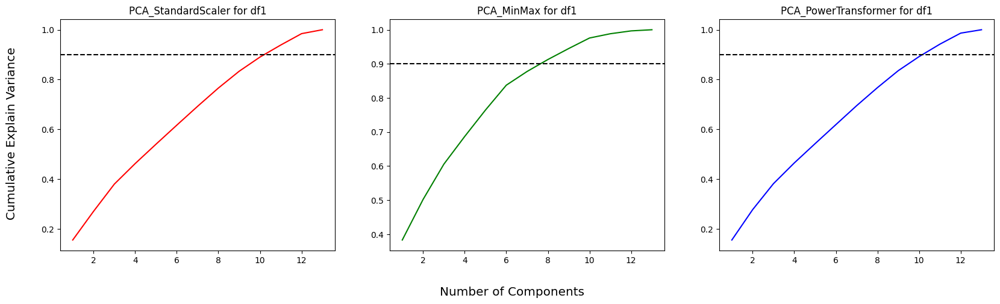

In [17]:
# 데이터 준비
X1 = df1.drop('Attrition_Flag', axis=1)
y1 = df1['Attrition_Flag']

# 데이터 분할
X1_train, X1_test, y1_train, y1_test = train_test_split(X1, y1, random_state=42)

# Feature scaling -- Standard Scaler
scaler_S1 = StandardScaler().fit(X1_train)
X_train_s1 = scaler_S1.transform(X1_train)
X_test_s1 = scaler_S1.transform(X1_test)

# Feature scaling -- MinMax Scaler
scaler_MM1 = MinMaxScaler().fit(X1_train)
X_train_mm1 = scaler_MM1.transform(X1_train)
X_test_mm1 = scaler_MM1.transform(X1_test)

# Feature scaling -- Power Transformer
scaler_PT1 = PowerTransformer().fit(X1_train)
X_train_pt1 = scaler_PT1.transform(X1_train)
X_test_pt1 = scaler_PT1.transform(X1_test)

# PCA -- Standard Scaler
pca_s1 = PCA().fit(X_train_s1)

# PCA -- MinMax Scaler
pca_mm1 = PCA().fit(X_train_mm1)

# PCA -- Power Transformer
pca_pt1 = PCA().fit(X_train_pt1)


# Plot the graph to see the number of components needed to explain the most data variance
fig, axs = plt.subplots(1, 3, figsize=(20,5))
fig.text(0.5, -0.04, 'Number of Components', ha='center', size="x-large")
fig.text(0.08, 0.5, 'Cumulative Explain Variance', va='center', rotation='vertical', size="x-large")

axs[0].plot(np.arange(1, pca_s1.explained_variance_ratio_.shape[0] + 1), 
            np.cumsum(pca_s1.explained_variance_ratio_), color="red")
axs[0].set_title(f"PCA_StandardScaler for df1")
axs[0].axhline(y=0.9, color='k', linestyle='--', label='90%')

axs[1].plot(np.arange(1, pca_mm1.explained_variance_ratio_.shape[0] + 1), 
            np.cumsum(pca_mm1.explained_variance_ratio_), color="green")
axs[1].set_title(f"PCA_MinMax for df1")
axs[1].axhline(y=0.9, color='k', linestyle='--', label='90%')

axs[2].plot(np.arange(1, pca_pt1.explained_variance_ratio_.shape[0] + 1), 
            np.cumsum(pca_pt1.explained_variance_ratio_), color="blue")
axs[2].set_title(f"PCA_PowerTransformer for df1")
axs[2].axhline(y=0.9, color='k', linestyle='--', label='90%')

plt.show()

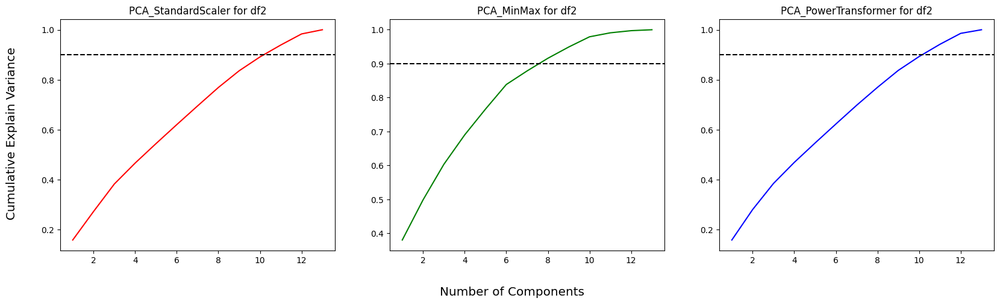

In [18]:
# 데이터 준비
X2 = df2.drop('Attrition_Flag', axis=1)
y2 = df2['Attrition_Flag']

# 데이터 분할
X2_train, X2_test, y2_train, y2_test = train_test_split(X2, y2, random_state=42)

# Feature scaling -- Standard Scaler
scaler_S2 = StandardScaler().fit(X2_train)
X_train_s2 = scaler_S2.transform(X2_train)
X_test_s2 = scaler_S2.transform(X2_test)

# Feature scaling -- MinMax Scaler
scaler_MM2 = MinMaxScaler().fit(X2_train)
X_train_mm2 = scaler_MM2.transform(X2_train)
X_test_mm2 = scaler_MM2.transform(X2_test)

# Feature scaling -- Power Transformer
scaler_PT2 = PowerTransformer().fit(X2_train)
X_train_pt2 = scaler_PT2.transform(X2_train)
X_test_pt2 = scaler_PT2.transform(X2_test)

# PCA -- Standard Scaler
pca_s2 = PCA().fit(X_train_s2)

# PCA -- MinMax Scaler
pca_mm2 = PCA().fit(X_train_mm2)

# PCA -- Power Transformer
pca_pt2 = PCA().fit(X_train_pt2)


# Plot the graph to see the number of components needed to explain the most data variance
fig, axs = plt.subplots(1, 3, figsize=(20,5))
fig.text(0.5, -0.04, 'Number of Components', ha='center', size="x-large")
fig.text(0.08, 0.5, 'Cumulative Explain Variance', va='center', rotation='vertical', size="x-large")

axs[0].plot(np.arange(1, pca_s2.explained_variance_ratio_.shape[0] + 1), 
            np.cumsum(pca_s2.explained_variance_ratio_), color="red")
axs[0].set_title(f"PCA_StandardScaler for df2")
axs[0].axhline(y=0.9, color='k', linestyle='--', label='90%')

axs[1].plot(np.arange(1, pca_mm2.explained_variance_ratio_.shape[0] + 1), 
            np.cumsum(pca_mm2.explained_variance_ratio_), color="green")
axs[1].set_title(f"PCA_MinMax for df2")
axs[1].axhline(y=0.9, color='k', linestyle='--', label='90%')

axs[2].plot(np.arange(1, pca_pt2.explained_variance_ratio_.shape[0] + 1), 
            np.cumsum(pca_pt2.explained_variance_ratio_), color="blue")
axs[2].set_title(f"PCA_PowerTransformer for df2")
axs[2].axhline(y=0.9, color='k', linestyle='--', label='90%')

plt.show()

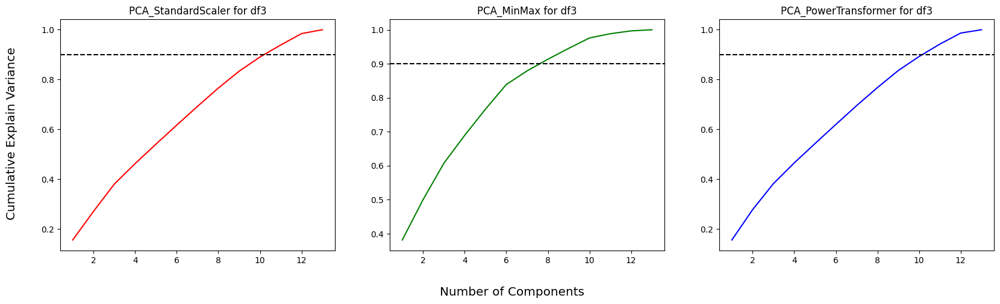

In [19]:
# 데이터 준비
X3 = df3.drop('Attrition_Flag', axis=1)
y3 = df3['Attrition_Flag']

# 데이터 분할
X3_train, X3_test, y3_train, y3_test = train_test_split(X3, y3, random_state=42)

# Feature scaling -- Standard Scaler
scaler_S3 = StandardScaler().fit(X3_train)
X_train_s3 = scaler_S3.transform(X3_train)
X_test_s3 = scaler_S3.transform(X3_test)

# Feature scaling -- MinMax Scaler
scaler_MM3 = MinMaxScaler().fit(X3_train)
X_train_mm3 = scaler_MM3.transform(X3_train)
X_test_mm3 = scaler_MM3.transform(X3_test)

# Feature scaling -- Power Transformer
scaler_PT3 = PowerTransformer().fit(X3_train)
X_train_pt3 = scaler_PT3.transform(X3_train)
X_test_pt3 = scaler_PT3.transform(X3_test)

# PCA -- Standard Scaler
pca_s3 = PCA().fit(X_train_s3)

# PCA -- MinMax Scaler
pca_mm3 = PCA().fit(X_train_mm3)

# PCA -- Power Transformer
pca_pt3 = PCA().fit(X_train_pt3)


# Plot the graph to see the number of components needed to explain the most data variance
fig, axs = plt.subplots(1, 3, figsize=(20,5))
fig.text(0.5, -0.04, 'Number of Components', ha='center', size="x-large")
fig.text(0.08, 0.5, 'Cumulative Explain Variance', va='center', rotation='vertical', size="x-large")

axs[0].plot(np.arange(1, pca_s3.explained_variance_ratio_.shape[0] + 1), 
            np.cumsum(pca_s3.explained_variance_ratio_), color="red")
axs[0].set_title(f"PCA_StandardScaler for df3")
axs[0].axhline(y=0.9, color='k', linestyle='--', label='90%')

axs[1].plot(np.arange(1, pca_mm3.explained_variance_ratio_.shape[0] + 1), 
            np.cumsum(pca_mm3.explained_variance_ratio_), color="green")
axs[1].set_title(f"PCA_MinMax for df3")
axs[1].axhline(y=0.9, color='k', linestyle='--', label='90%')

axs[2].plot(np.arange(1, pca_pt3.explained_variance_ratio_.shape[0] + 1), 
            np.cumsum(pca_pt3.explained_variance_ratio_), color="blue")
axs[2].set_title(f"PCA_PowerTransformer for df3")
axs[2].axhline(y=0.9, color='k', linestyle='--', label='90%')

plt.show()

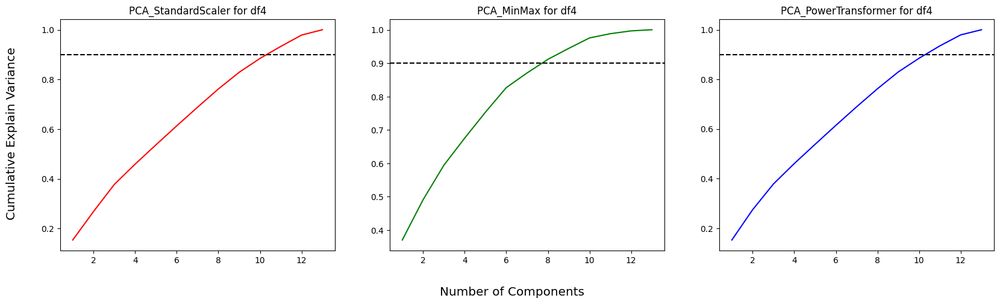

In [20]:
# 데이터 준비
X4 = df4.drop('Attrition_Flag', axis=1)
y4 = df4['Attrition_Flag']

# 데이터 분할
X4_train, X4_test, y4_train, y4_test = train_test_split(X4, y4, random_state=42)

# Feature scaling -- Standard Scaler
scaler_S4 = StandardScaler().fit(X4_train)
X_train_s4 = scaler_S4.transform(X4_train)
X_test_s4 = scaler_S4.transform(X4_test)

# Feature scaling -- MinMax Scaler
scaler_MM4 = MinMaxScaler().fit(X4_train)
X_train_mm4 = scaler_MM4.transform(X4_train)
X_test_mm4 = scaler_MM4.transform(X4_test)

# Feature scaling -- Power Transformer
scaler_PT4 = PowerTransformer().fit(X4_train)
X_train_pt4 = scaler_PT4.transform(X4_train)
X_test_pt4 = scaler_PT4.transform(X4_test)

# PCA -- Standard Scaler
pca_s4 = PCA().fit(X_train_s4)

# PCA -- MinMax Scaler
pca_mm4 = PCA().fit(X_train_mm4)

# PCA -- Power Transformer
pca_pt4 = PCA().fit(X_train_pt4)


# Plot the graph to see the number of components needed to explain the most data variance
fig, axs = plt.subplots(1, 3, figsize=(20,5))
fig.text(0.5, -0.04, 'Number of Components', ha='center', size="x-large")
fig.text(0.08, 0.5, 'Cumulative Explain Variance', va='center', rotation='vertical', size="x-large")

axs[0].plot(np.arange(1, pca_s4.explained_variance_ratio_.shape[0] + 1), 
            np.cumsum(pca_s4.explained_variance_ratio_), color="red")
axs[0].set_title(f"PCA_StandardScaler for df4")
axs[0].axhline(y=0.9, color='k', linestyle='--', label='90%')

axs[1].plot(np.arange(1, pca_mm4.explained_variance_ratio_.shape[0] + 1), 
            np.cumsum(pca_mm4.explained_variance_ratio_), color="green")
axs[1].set_title(f"PCA_MinMax for df4")
axs[1].axhline(y=0.9, color='k', linestyle='--', label='90%')

axs[2].plot(np.arange(1, pca_pt4.explained_variance_ratio_.shape[0] + 1), 
            np.cumsum(pca_pt4.explained_variance_ratio_), color="blue")
axs[2].set_title(f"PCA_PowerTransformer for df4")
axs[2].axhline(y=0.9, color='k', linestyle='--', label='90%')

plt.show()

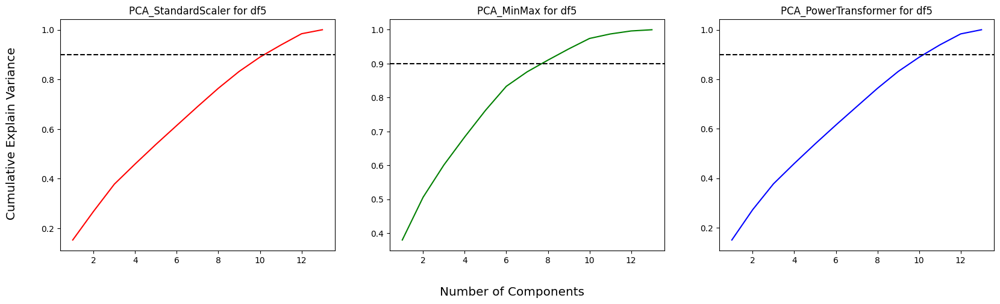

In [21]:
# 데이터 준비
X5 = df5.drop('Attrition_Flag', axis=1)
y5 = df5['Attrition_Flag']

# 데이터 분할
X5_train, X5_test, y5_train, y5_test = train_test_split(X5, y5, random_state=42)

# Feature scaling Standard Scaler
scaler_S5 = StandardScaler().fit(X5_train)
X_train_s5 = scaler_S5.transform(X5_train)
X_test_s5 = scaler_S5.transform(X5_test)

# Feature scaling MinMax Scaler
scaler_MM5 = MinMaxScaler().fit(X5_train)
X_train_mm5 = scaler_MM5.transform(X5_train)
X_test_mm5 = scaler_MM5.transform(X5_test)

# Feature scaling Power Transformer
scaler_PT5 = PowerTransformer().fit(X5_train)
X_train_pt5 = scaler_PT5.transform(X5_train)
X_test_pt5 = scaler_PT5.transform(X5_test)

# PCA - Standard Scaler
pca_s5 = PCA().fit(X_train_s5)

# PCA - MinMax Scaler
pca_mm5 = PCA().fit(X_train_mm5)

# PCA - Power Transformer
pca_pt5 = PCA().fit(X_train_pt5)


# 가장 많은 데이터 분산을 설명하기 위헤 필요한 주성분 분석 그래프
fig, axs = plt.subplots(1, 3, figsize=(20,5))
fig.text(0.5, -0.04, 'Number of Components', ha='center', size="x-large")
fig.text(0.08, 0.5, 'Cumulative Explain Variance', va='center', rotation='vertical', size="x-large")

axs[0].plot(np.arange(1, pca_s5.explained_variance_ratio_.shape[0] + 1), 
            np.cumsum(pca_s5.explained_variance_ratio_), color="red")
axs[0].set_title(f"PCA_StandardScaler for df5")
axs[0].axhline(y=0.9, color='k', linestyle='--', label='90%')

axs[1].plot(np.arange(1, pca_mm5.explained_variance_ratio_.shape[0] + 1), 
            np.cumsum(pca_mm5.explained_variance_ratio_), color="green")
axs[1].set_title(f"PCA_MinMax for df5")
axs[1].axhline(y=0.9, color='k', linestyle='--', label='90%')

axs[2].plot(np.arange(1, pca_pt5.explained_variance_ratio_.shape[0] + 1), 
            np.cumsum(pca_pt5.explained_variance_ratio_), color="blue")
axs[2].set_title(f"PCA_PowerTransformer for df5")
axs[2].axhline(y=0.9, color='k', linestyle='--', label='90%')

plt.show()

#### PCA 평가
각 곡선은 df1 부터 df5 까지 13개 차원 분산 중 첫 번째 N개의 구성 요소에 얼마나 많은 분산이 포함되어 있는지 나타냅니다.
1. PCA Standard Scaler - 첫 10개의 구성 요소가 전체 분산의 90%를 포함하고 있습니다.
2. PCA Min-Max - MinMax를 사용하여 스케일링한 후 PCA를 수행하여, 첫 8개의 구성 요소가 전체 분산의 90%를 포함하고 있습니다.
3. PCA Power Transformer - Power Transformer를 사용하여 스케일링한 후 PCA를 수행하여, 첫 10개의 구성 요소가 전체 분산의 90%를 포함하고 있습니다.

#### 각 df에 스케일링 별로 차원 수 줄이기

In [22]:
# PCA - Standard Scaler
pca_s1 = PCA(n_components=10)
X_train_s_pca1 = pca_s1.fit_transform(X_train_s1)
X_test_s_pca1 = pca_s1.transform(X_test_s1)

# PCA - MinMax Scaler
pca_mm1 = PCA(n_components=8)
X_train_mm_pca1 = pca_mm1.fit_transform(X_train_mm1)
X_test_mm_pca1 = pca_mm1.transform(X_test_mm1)

# PCA - Power Transformer
pca_pt1 = PCA(n_components=10)
X_train_pt_pca1 = pca_pt1.fit_transform(X_train_pt1)
X_test_pt_pca1 = pca_pt1.transform(X_test_pt1)

# Shape
print("df1")
print("Original shape: ", X1_train.shape)
print("\nAfter PCA & SS: ", X_train_s_pca1.shape)
print("After PCA & MM: ", X_train_mm_pca1.shape)
print("After PCA & PT: ", X_train_pt_pca1.shape)
print()

df1
Original shape:  (7595, 13)

After PCA & SS:  (7595, 10)
After PCA & MM:  (7595, 8)
After PCA & PT:  (7595, 10)



In [23]:
# PCA - Standard Scaler
pca_s2 = PCA(n_components=10)
X_train_s_pca2 = pca_s2.fit_transform(X_train_s2)
X_test_s_pca2 = pca_s2.transform(X_test_s2)

# PCA - MinMax Scaler
pca_mm2 = PCA(n_components=8)
X_train_mm_pca2 = pca_mm2.fit_transform(X_train_mm2)
X_test_mm_pca2 = pca_mm2.transform(X_test_mm2)

# PCA - Power Transformer
pca_pt2 = PCA(n_components=10)
X_train_pt_pca2 = pca_pt2.fit_transform(X_train_pt2)
X_test_pt_pca2 = pca_pt2.transform(X_test_pt2)

# Shape
print("df2")
print("Original shape: ", X2_train.shape)
print("\nAfter PCA & SS: ", X_train_s_pca2.shape)
print("After PCA & MM: ", X_train_mm_pca2.shape)
print("After PCA & PT: ", X_train_pt_pca2.shape)
print()

df2
Original shape:  (5310, 13)

After PCA & SS:  (5310, 10)
After PCA & MM:  (5310, 8)
After PCA & PT:  (5310, 10)



In [24]:
# PCA - Standard Scaler
pca_s3 = PCA(n_components=10)
X_train_s_pca3 = pca_s3.fit_transform(X_train_s3)
X_test_s_pca3 = pca_s3.transform(X_test_s3)

# PCA - MinMax Scaler
pca_mm3 = PCA(n_components=8)
X_train_mm_pca3 = pca_mm3.fit_transform(X_train_mm3)
X_test_mm_pca3 = pca_mm3.transform(X_test_mm3)

# PCA - Power Transformer
pca_pt3 = PCA(n_components=10)
X_train_pt_pca3 = pca_pt3.fit_transform(X_train_pt3)
X_test_pt_pca3 = pca_pt3.transform(X_test_pt3)

# Shape
print("df3")
print("Original shape: ", X3_train.shape)
print("\nAfter PCA & SS: ", X_train_s_pca3.shape)
print("After PCA & MM: ", X_train_mm_pca3.shape)
print("After PCA & PT: ", X_train_pt_pca3.shape)
print()

df3
Original shape:  (7595, 13)

After PCA & SS:  (7595, 10)
After PCA & MM:  (7595, 8)
After PCA & PT:  (7595, 10)



In [25]:
# PCA - Standard Scaler
pca_s4 = PCA(n_components=10)
X_train_s_pca4 = pca_s4.fit_transform(X_train_s4)
X_test_s_pca4 = pca_s4.transform(X_test_s4)

# PCA - MinMax Scaler
pca_mm4 = PCA(n_components=8)
X_train_mm_pca4 = pca_mm4.fit_transform(X_train_mm4)
X_test_mm_pca4 = pca_mm4.transform(X_test_mm4)

# PCA - Power Transformer
pca_pt4 = PCA(n_components=10)
X_train_pt_pca4 = pca_pt4.fit_transform(X_train_pt4)
X_test_pt_pca4 = pca_pt4.transform(X_test_pt4)

# Shape
print("df4")
print("Original shape: ", X4_train.shape)
print("\nAfter PCA & SS: ", X_train_s_pca4.shape)
print("After PCA & MM: ", X_train_mm_pca4.shape)
print("After PCA & PT: ", X_train_pt_pca4.shape)
print()

df4
Original shape:  (7595, 13)

After PCA & SS:  (7595, 10)
After PCA & MM:  (7595, 8)
After PCA & PT:  (7595, 10)



In [26]:
# PCA - Standard Scaler
pca_s5 = PCA(n_components=10)
X_train_s_pca5 = pca_s5.fit_transform(X_train_s5)
X_test_s_pca5 = pca_s5.transform(X_test_s5)

# PCA - MinMax Scaler
pca_mm5 = PCA(n_components=8)
X_train_mm_pca5 = pca_mm5.fit_transform(X_train_mm5)
X_test_mm_pca5 = pca_mm5.transform(X_test_mm5)

# PCA - Power Transformer
pca_pt5 = PCA(n_components=10)
X_train_pt_pca5 = pca_pt5.fit_transform(X_train_pt5)
X_test_pt_pca5 = pca_pt5.transform(X_test_pt5)

# Shape
print("df5")
print("Original shape: ", X5_train.shape)
print("\nAfter PCA & SS: ", X_train_s_pca5.shape)
print("After PCA & MM: ", X_train_mm_pca5.shape)
print("After PCA & PT: ", X_train_pt_pca5.shape)
print()

df5
Original shape:  (7595, 13)

After PCA & SS:  (7595, 10)
After PCA & MM:  (7595, 8)
After PCA & PT:  (7595, 10)



## 3. 모델링 및 하이퍼파라미터 튜닝


#### SMOTE (Synthetic Minority Over-sampling Technique)
하나의 클래스가 다른 클래스에 비해 상대적으로 적은 상태인 클래스 불균형 문제를 해결하기 위한 오버샘플링 기법 중 하나로, 모델이 다수 클래스에 치우쳐 학습되는 현상을 막기 위해 사용됩니다.

In [27]:
# Attrition_Flag 불균형 데이터 확인
Counter(y)

Counter({1: 8500, 0: 1627})

In [28]:
# Kfold 교차감정 이용
kf = KFold(n_splits=5)

In [29]:
# 일반 머신러닝에 적용할 함수
def imba_pipe(model, X_train_s_pca, y_train):
    imba_pipeline = make_pipeline(SMOTE(random_state=42), model)
    return cross_val_score(imba_pipeline, X_train_s_pca, y_train, scoring="recall", cv=kf)

# 포레스트 모델에 적용할 함수 - 스케일링이 필요없는 모델
def imba_pipe_forest(model, X_train, y_train):
    imba_pipeline = make_pipeline(SMOTE(random_state=42), model)
    return cross_val_score(imba_pipeline, X_train, y_train, scoring="recall", cv=kf)

# 훈련과 테스트에 적용할 SMOTE 기법
def imba_pipe_fit(model):
    imba_pipeline = Pipeline(steps=[('smote', SMOTE(random_state=42)), 
                                    ('model', model)
                                   ])
    return imba_pipeline

In [30]:
# Knn
knn = KNeighborsClassifier(n_neighbors=100)

# df1-df5 까지 적용
for i in range(1, 6):
    X_train_s_pca = globals()[f'X_train_s_pca{i}']
    X_train = globals()[f'X{i}_train']
    y_train = globals()[f'y{i}_train']
    
    knn_recall = imba_pipe(knn, X_train_s_pca, y_train)

    print(f"Results for df{i}:")
    print("Array of KNN recall score after KFold and resample: ", knn_recall)
    print("Mean of array KNN recall score: ", round(knn_recall.mean(), 2))
    print()


Results for df1:
Array of KNN recall score after KFold and resample:  [0.71025842 0.7090768  0.71202532 0.69585614 0.7057903 ]
Mean of array KNN recall score:  0.71

Results for df2:
Array of KNN recall score after KFold and resample:  [0.68666667 0.73519553 0.68309071 0.70169492 0.67374302]
Mean of array KNN recall score:  0.7

Results for df3:
Array of KNN recall score after KFold and resample:  [0.70634299 0.69666408 0.71123418 0.69429242 0.71126761]
Mean of array KNN recall score:  0.7

Results for df4:
Array of KNN recall score after KFold and resample:  [0.70321065 0.6943367  0.70015823 0.70523847 0.69640063]
Mean of array KNN recall score:  0.7

Results for df5:
Array of KNN recall score after KFold and resample:  [0.71495693 0.6927851  0.71598101 0.68725567 0.70266041]
Mean of array KNN recall score:  0.7



In [31]:
# 최상의 하이퍼 파라미터 값 찾기 - GridSearchCV
knn1 = KNeighborsClassifier()
knn_params = {"model__n_neighbors":[2,5,10,87,100],
              "model__weights":["uniform", "distance"],
              "model__p":[1,2]
             }
for i in range(1, 6):
    X_train_s_pca = globals()[f'X_train_s_pca{i}']
    y_train = globals()[f'y{i}_train']
    X_test_s_pca = globals()[f'X_test_s_pca{i}']
    y_test = globals()[f'y{i}_test']

    knn_grid = GridSearchCV(imba_pipe_fit(knn1), knn_params, cv=kf, scoring="recall")
    knn_grid.fit(X_train_s_pca, y_train)

    print(f"Results for df{i}:")
    print("Best parameters for KNN: ", knn_grid.best_params_)
    print(f"\nKNN Grid best train recall score: {knn_grid.best_score_ :.2f}")
    print(f"KNN Grid best test recall score: {recall_score(y_test, knn_grid.best_estimator_.predict(X_test_s_pca)) :.2f}")

Results for df1:
Best parameters for KNN:  {'model__n_neighbors': 2, 'model__p': 2, 'model__weights': 'distance'}

KNN Grid best train recall score: 0.85
KNN Grid best test recall score: 0.85
Results for df2:
Best parameters for KNN:  {'model__n_neighbors': 2, 'model__p': 2, 'model__weights': 'distance'}

KNN Grid best train recall score: 0.86
KNN Grid best test recall score: 0.86
Results for df3:
Best parameters for KNN:  {'model__n_neighbors': 2, 'model__p': 2, 'model__weights': 'distance'}

KNN Grid best train recall score: 0.86
KNN Grid best test recall score: 0.85
Results for df4:
Best parameters for KNN:  {'model__n_neighbors': 2, 'model__p': 2, 'model__weights': 'distance'}

KNN Grid best train recall score: 0.86
KNN Grid best test recall score: 0.85
Results for df5:
Best parameters for KNN:  {'model__n_neighbors': 2, 'model__p': 2, 'model__weights': 'distance'}

KNN Grid best train recall score: 0.85
KNN Grid best test recall score: 0.85


In [32]:
# 랜덤포레스트
rfc = RandomForestClassifier(max_depth= None, max_features=5, min_samples_split=2, criterion="gini")

for i in range(1, 6):
    X_train = globals()[f'X{i}_train']
    y_train = globals()[f'y{i}_train']
    
    rfc_recall = imba_pipe_forest(rfc, X_train, y_train)

    print(f"Results for df{i}:")
    print("Array of RFC recall score after KFold and resample: ", rfc_recall)
    print("Mean of array RFC recall score: ", round(rfc_recall.mean(), 2))

Results for df1:
Array of RFC recall score after KFold and resample:  [0.95536413 0.94259116 0.95648734 0.95543393 0.94444444]
Mean of array RFC recall score:  0.95
Results for df2:
Array of RFC recall score after KFold and resample:  [0.94333333 0.95418994 0.92721165 0.94124294 0.95642458]
Mean of array RFC recall score:  0.94
Results for df3:
Array of RFC recall score after KFold and resample:  [0.94753328 0.94491854 0.95411392 0.95230649 0.94679186]
Mean of array RFC recall score:  0.95
Results for df4:
Array of RFC recall score after KFold and resample:  [0.9678935  0.96664081 0.97389241 0.96559812 0.96322379]
Mean of array RFC recall score:  0.97
Results for df5:
Array of RFC recall score after KFold and resample:  [0.94909945 0.94414275 0.95490506 0.95230649 0.94600939]
Mean of array RFC recall score:  0.95


In [33]:
# 최상의 하이퍼 파라미터 값 찾기 - GridSearchCV
rfc1 = RandomForestClassifier(max_depth= None)

rfc_params = {"model__criterion":["gini", "entropy"],
            "model__min_samples_split": np.arange(2,6), 
            "model__max_features":[5, "sqrt", "log2"]
            }

for i in range(1, 6):
    X_train = globals()[f'X{i}_train']
    y_train = globals()[f'y{i}_train']
    X_test = globals()[f'X{i}_test']
    y_test = globals()[f'y{i}_test']

    rfc_grid = GridSearchCV(imba_pipe_fit(rfc1), rfc_params, cv=kf, scoring="recall")
    rfc_grid.fit(X_train, y_train)
    
    print(f"Results for df{i}:")
    print("Best parameters for RFC: ", rfc_grid.best_params_)
    print(f"\nRFC Grid best train recall score: {rfc_grid.best_score_ :.2f}")
    print(f"RFC Grid best test recall score: {recall_score(y_test, rfc_grid.best_estimator_.predict(X_test)) :.2f}")

Results for df1:
Best parameters for RFC:  {'model__criterion': 'entropy', 'model__max_features': 'log2', 'model__min_samples_split': 4}

RFC Grid best train recall score: 0.95
RFC Grid best test recall score: 0.95
Results for df2:
Best parameters for RFC:  {'model__criterion': 'gini', 'model__max_features': 'sqrt', 'model__min_samples_split': 5}

RFC Grid best train recall score: 0.95
RFC Grid best test recall score: 0.95
Results for df3:
Best parameters for RFC:  {'model__criterion': 'entropy', 'model__max_features': 'log2', 'model__min_samples_split': 5}

RFC Grid best train recall score: 0.95
RFC Grid best test recall score: 0.95
Results for df4:
Best parameters for RFC:  {'model__criterion': 'entropy', 'model__max_features': 'sqrt', 'model__min_samples_split': 3}

RFC Grid best train recall score: 0.97
RFC Grid best test recall score: 0.97
Results for df5:
Best parameters for RFC:  {'model__criterion': 'entropy', 'model__max_features': 'sqrt', 'model__min_samples_split': 5}

RFC G

In [34]:
# XGBoost
xgbc = XGBClassifier(booster="gbtree", learning_rate=0.1, max_delta_step=1, verbosity=0, use_label_encoder=False)

for i in range(1, 6):
    X_train = globals()[f'X{i}_train']
    y_train = globals()[f'y{i}_train']

    xgbc_recall = imba_pipe_forest(xgbc, X_train, y_train)
    
    print(f"Results for df{i}:")
    print("Array of XGBC recall score after KFold and resample: ", xgbc_recall)
    print("Mean of array XGBC recall score: ", round(xgbc_recall.mean(), 2))

Results for df1:
Array of XGBC recall score after KFold and resample:  [0.9467502  0.94724593 0.95332278 0.95308835 0.94757433]
Mean of array XGBC recall score:  0.95
Results for df2:
Array of XGBC recall score after KFold and resample:  [0.94333333 0.95307263 0.92945129 0.93785311 0.9575419 ]
Mean of array XGBC recall score:  0.94
Results for df3:
Array of XGBC recall score after KFold and resample:  [0.94440094 0.94414275 0.95174051 0.95465207 0.94679186]
Mean of array XGBC recall score:  0.95
Results for df4:
Array of XGBC recall score after KFold and resample:  [0.96945967 0.97439876 0.97310127 0.97654418 0.96713615]
Mean of array XGBC recall score:  0.97
Results for df5:
Array of XGBC recall score after KFold and resample:  [0.9467502  0.95034911 0.94857595 0.95230649 0.94600939]
Mean of array XGBC recall score:  0.95


In [35]:
# 최상의 하이퍼 파라미터 값 찾기 - GridSearchCV
xgbc1 = XGBClassifier(booster="gbtree", verbosity=0, use_label_encoder=False)

xgbc_params = {"model__learning_rate": [0.05, 0.1, 0.2, 0.3, 0.4, 0.5],
               "model__max_depth": np.arange(2,7),
               "model__max_delta_step": np.arange(1,11)
              }

for i in range(1, 6):
    X_train = globals()[f'X{i}_train']
    y_train = globals()[f'y{i}_train']
    X_test = globals()[f'X{i}_test']
    y_test = globals()[f'y{i}_test']

    xgbc_grid = GridSearchCV(imba_pipe_fit(xgbc1), xgbc_params, cv=kf, scoring="recall")
    xgbc_grid.fit(X_train, y_train)

    print(f"Results for df{i}:")
    print("Best parameters for XGBC: ", xgbc_grid.best_params_)
    print(f"\nXGBC Grid best train recall score: {xgbc_grid.best_score_ :.2f}")
    print(f"XGBC Grid best test recall score: {recall_score(y_test, xgbc_grid.best_estimator_.predict(X_test)) :.2f}")

Results for df1:
Best parameters for XGBC:  {'model__learning_rate': 0.4, 'model__max_delta_step': 2, 'model__max_depth': 6}

XGBC Grid best train recall score: 0.96
XGBC Grid best test recall score: 0.95
Results for df2:
Best parameters for XGBC:  {'model__learning_rate': 0.4, 'model__max_delta_step': 2, 'model__max_depth': 4}

XGBC Grid best train recall score: 0.95
XGBC Grid best test recall score: 0.95
Results for df3:
Best parameters for XGBC:  {'model__learning_rate': 0.4, 'model__max_delta_step': 4, 'model__max_depth': 6}

XGBC Grid best train recall score: 0.96
XGBC Grid best test recall score: 0.95
Results for df4:
Best parameters for XGBC:  {'model__learning_rate': 0.4, 'model__max_delta_step': 1, 'model__max_depth': 5}

XGBC Grid best train recall score: 0.98
XGBC Grid best test recall score: 0.97
Results for df5:
Best parameters for XGBC:  {'model__learning_rate': 0.4, 'model__max_delta_step': 3, 'model__max_depth': 5}

XGBC Grid best train recall score: 0.96
XGBC Grid best

In [36]:
# 로지스틱회귀
logr = LogisticRegression(fit_intercept=True, solver="saga", penalty="l1", C=0.5)

for i in range(1, 6):
    X_train_s_pca = globals()[f'X_train_s_pca{i}']
    y_train = globals()[f'y{i}_train']
    
    logr_recall = imba_pipe(logr, X_train_s_pca, y_train)
    print("Array of LogReg recall score after KFold and resample: ", logr_recall)
    print("Mean of array LogReg recall score: ", round(logr_recall.mean(), 2))

Array of LogReg recall score after KFold and resample:  [0.76664056 0.742436   0.75949367 0.7505864  0.76134585]
Mean of array LogReg recall score:  0.76
Array of LogReg recall score after KFold and resample:  [0.76       0.78547486 0.73012318 0.76723164 0.73407821]
Mean of array LogReg recall score:  0.76
Array of LogReg recall score after KFold and resample:  [0.76820673 0.7416602  0.75791139 0.75215012 0.76056338]
Mean of array LogReg recall score:  0.76
Array of LogReg recall score after KFold and resample:  [0.76820673 0.74709077 0.75949367 0.75215012 0.75821596]
Mean of array LogReg recall score:  0.76
Array of LogReg recall score after KFold and resample:  [0.76037588 0.73467804 0.75553797 0.74433151 0.75743349]
Mean of array LogReg recall score:  0.75


In [37]:
# 최상의 하이퍼 파라미터 값 찾기 - GridSearchCV
logr1 = LogisticRegression()

logr_params = {"model__solver": ["lbfgs", "sag", "saga"],
               "model__C": np.arange(0.1,2,0.1), 
               "model__class_weight": ["balanced", None]
              }

for i in range(1, 6):
    X_train_s_pca = globals()[f'X_train_s_pca{i}']
    X_test_s_pca = globals()[f'X_test_s_pca{i}']
    y_train = globals()[f'y{i}_train']
    y_test = globals()[f'y{i}_test']

    knn_recall = imba_pipe(knn, X_train_s_pca, y_train)


    logr_grid = GridSearchCV(imba_pipe_fit(logr1), logr_params, cv=kf, scoring="recall")
    logr_grid.fit(X_train_s_pca, y_train)

    
    print(f"Results for df{i}:")
    print("Best parameters for LogReg: ", logr_grid.best_params_)
    print(f"\nLogreg Grid best train recall score: {logr_grid.best_score_ :.2f}")
    print(f"Logreg Grid best test recall score: {recall_score(y_test, logr_grid.best_estimator_.predict(X_test_s_pca)) :.2f}")

Results for df1:
Best parameters for LogReg:  {'model__C': 0.1, 'model__class_weight': 'balanced', 'model__solver': 'lbfgs'}

Logreg Grid best train recall score: 0.76
Logreg Grid best test recall score: 0.75
Results for df2:
Best parameters for LogReg:  {'model__C': 0.5, 'model__class_weight': 'balanced', 'model__solver': 'saga'}

Logreg Grid best train recall score: 0.76
Logreg Grid best test recall score: 0.74
Results for df3:
Best parameters for LogReg:  {'model__C': 0.1, 'model__class_weight': 'balanced', 'model__solver': 'lbfgs'}

Logreg Grid best train recall score: 0.76
Logreg Grid best test recall score: 0.75
Results for df4:
Best parameters for LogReg:  {'model__C': 1.1, 'model__class_weight': None, 'model__solver': 'saga'}

Logreg Grid best train recall score: 0.76
Logreg Grid best test recall score: 0.75
Results for df5:
Best parameters for LogReg:  {'model__C': 0.30000000000000004, 'model__class_weight': 'balanced', 'model__solver': 'lbfgs'}

Logreg Grid best train recall 

In [38]:
# 서포트벡터머신
svc = SVC(kernel="rbf", C=0.5, gamma="auto")

for i in range(1, 6):
    X_train_s_pca = globals()[f'X_train_s_pca{i}']
    y_train = globals()[f'y{i}_train']

    svc_recall = imba_pipe(svc, X_train_s_pca, y_train)

    print(f"Results for df{i}:")
    print("Array of SVC recall score after KFold and resample: ", svc_recall)
    print("Mean of array SVC recall score: ", round(svc_recall.mean(), 2))

Results for df1:
Array of SVC recall score after KFold and resample:  [0.8183242  0.81923972 0.82515823 0.80766224 0.81533646]
Mean of array SVC recall score:  0.82
Results for df2:
Array of SVC recall score after KFold and resample:  [0.81222222 0.84134078 0.81634938 0.83163842 0.80558659]
Mean of array SVC recall score:  0.82
Results for df3:
Array of SVC recall score after KFold and resample:  [0.81989037 0.8231187  0.82436709 0.81313526 0.8114241 ]
Mean of array SVC recall score:  0.82
Results for df4:
Array of SVC recall score after KFold and resample:  [0.82850431 0.8223429  0.83227848 0.81548084 0.81690141]
Mean of array SVC recall score:  0.82
Results for df5:
Array of SVC recall score after KFold and resample:  [0.82458888 0.80527541 0.82753165 0.81782643 0.80985915]
Mean of array SVC recall score:  0.82


In [39]:
# 최상의 하이퍼 파라미터 값 찾기 - GridSearchCV
svc1 = SVC()

svc_params = {"model__C": [0.1, 0.2, 0.3, 0.4],
              "model__kernel": ["rbf", "sigmoid"],
              "model__gamma": [0.2, "scale", "auto"]
             }

for i in range(1, 6):
    X_train_s_pca = globals()[f'X_train_s_pca{i}']
    X_test_s_pca = globals()[f'X_test_s_pca{i}']
    y_train = globals()[f'y{i}_train']
    y_test = globals()[f'y{i}_test']

    svc_grid = GridSearchCV(imba_pipe_fit(svc1), svc_params, cv=kf, scoring="recall")
    svc_grid.fit(X_train_s_pca, y_train) 

    print(f"Results for df{i}:")
    print("Best parameters for SVC: ", svc_grid.best_params_)
    print(f"\nSVC Grid best train recall score: {svc_grid.best_score_ :.2f}")
    print(f"SVC Grid best test recall score: {recall_score(y_test, svc_grid.best_estimator_.predict(X_test_s_pca)) :.2f}")

Results for df1:
Best parameters for SVC:  {'model__C': 0.4, 'model__gamma': 0.2, 'model__kernel': 'rbf'}

SVC Grid best train recall score: 0.84
SVC Grid best test recall score: 0.82
Results for df2:
Best parameters for SVC:  {'model__C': 0.4, 'model__gamma': 0.2, 'model__kernel': 'rbf'}

SVC Grid best train recall score: 0.85
SVC Grid best test recall score: 0.85
Results for df3:
Best parameters for SVC:  {'model__C': 0.4, 'model__gamma': 0.2, 'model__kernel': 'rbf'}

SVC Grid best train recall score: 0.84
SVC Grid best test recall score: 0.82
Results for df4:
Best parameters for SVC:  {'model__C': 0.4, 'model__gamma': 0.2, 'model__kernel': 'rbf'}

SVC Grid best train recall score: 0.85
SVC Grid best test recall score: 0.83
Results for df5:
Best parameters for SVC:  {'model__C': 0.4, 'model__gamma': 0.2, 'model__kernel': 'rbf'}

SVC Grid best train recall score: 0.84
SVC Grid best test recall score: 0.83


## 4. 분류성능지표


In [40]:
# KNN 혼동행렬 df1 - df5
for i in range(1, 6):
    X_test_s_pca = globals()[f'X_test_s_pca{i}']
    y_test = globals()[f'y{i}_test']

    knn_pred = knn_grid.best_estimator_.predict(X_test_s_pca)
    knn_confusion = confusion_matrix(y_test, knn_pred)
    knn_class_report = classification_report(y_test, knn_pred, target_names=["0", "1"])

    print(f"Results for df{i}:")
    print("KNN confusion matrix\n", knn_confusion)
    print("______________________________________\n")
    print("KNN classification report\n\n", knn_class_report)

Results for df1:
KNN confusion matrix
 [[ 202  217]
 [ 350 1763]]
______________________________________

KNN classification report

               precision    recall  f1-score   support

           0       0.37      0.48      0.42       419
           1       0.89      0.83      0.86      2113

    accuracy                           0.78      2532
   macro avg       0.63      0.66      0.64      2532
weighted avg       0.80      0.78      0.79      2532

Results for df2:
KNN confusion matrix
 [[ 123  148]
 [ 233 1267]]
______________________________________

KNN classification report

               precision    recall  f1-score   support

           0       0.35      0.45      0.39       271
           1       0.90      0.84      0.87      1500

    accuracy                           0.78      1771
   macro avg       0.62      0.65      0.63      1771
weighted avg       0.81      0.78      0.80      1771

Results for df3:
KNN confusion matrix
 [[ 193  226]
 [ 332 1781]]
____________

In [41]:
# 랜덤포레스트 혼동행렬 df1 - df5
for i in range(1, 6):
    X_test = globals()[f'X{i}_test']
    y_test = globals()[f'y{i}_test']

    rfc_pred = rfc_grid.best_estimator_.predict(X_test)
    rfc_confusion = confusion_matrix(y_test, rfc_pred)
    rfc_class_report = classification_report(y_test, rfc_pred, target_names=["0", "1"])
    
    print(f"Results for df{i}:")
    print("RFC confusion matrix\n", rfc_confusion)
    print("______________________________________\n")
    print("RFC classification report\n\n", rfc_class_report)

Results for df1:
RFC confusion matrix
 [[ 344   75]
 [ 112 2001]]
______________________________________

RFC classification report

               precision    recall  f1-score   support

           0       0.75      0.82      0.79       419
           1       0.96      0.95      0.96      2113

    accuracy                           0.93      2532
   macro avg       0.86      0.88      0.87      2532
weighted avg       0.93      0.93      0.93      2532

Results for df2:
RFC confusion matrix
 [[ 256   15]
 [  18 1482]]
______________________________________

RFC classification report

               precision    recall  f1-score   support

           0       0.93      0.94      0.94       271
           1       0.99      0.99      0.99      1500

    accuracy                           0.98      1771
   macro avg       0.96      0.97      0.96      1771
weighted avg       0.98      0.98      0.98      1771

Results for df3:
RFC confusion matrix
 [[ 344   75]
 [ 112 2001]]
____________

In [42]:
# XGBoost 혼동행렬 df1 - df5
for i in range(1,6):
    X_test = globals()[f'X{i}_test']
    y_test = globals()[f'y{i}_test']
    
    xgbc_pred = xgbc_grid.best_estimator_.predict(X_test)
    xgbc_confusion = confusion_matrix(y_test, xgbc_pred)
    xgbc_class_report = classification_report(y_test, xgbc_pred, target_names=["0", "1"])

    print(f"Results for df{i}:")
    print("XGBC confusion matrix\n", xgbc_confusion)
    print("______________________________________\n")
    print("XGBC classification report\n\n", xgbc_class_report)

Results for df1:
XGBC confusion matrix
 [[ 344   75]
 [ 104 2009]]
______________________________________

XGBC classification report

               precision    recall  f1-score   support

           0       0.77      0.82      0.79       419
           1       0.96      0.95      0.96      2113

    accuracy                           0.93      2532
   macro avg       0.87      0.89      0.88      2532
weighted avg       0.93      0.93      0.93      2532

Results for df2:
XGBC confusion matrix
 [[ 253   18]
 [  33 1467]]
______________________________________

XGBC classification report

               precision    recall  f1-score   support

           0       0.88      0.93      0.91       271
           1       0.99      0.98      0.98      1500

    accuracy                           0.97      1771
   macro avg       0.94      0.96      0.95      1771
weighted avg       0.97      0.97      0.97      1771

Results for df3:
XGBC confusion matrix
 [[ 346   73]
 [ 103 2010]]
_______

In [43]:
# 로지스틱회귀 혼동행렬 df1 - df5
for i in range(1, 6):
    X_test_s_pca = globals()[f'X_test_s_pca{i}']
    y_test = globals()[f'y{i}_test']

    logr_pred = logr_grid.best_estimator_.predict(X_test_s_pca)
    logr_confusion = confusion_matrix(y_test, logr_pred)
    logr_class_report = classification_report(y_test, logr_pred, target_names=["0", "1"])

    print(f"Results for df{i}:")
    print("Logistic Regression confusion matrix\n", logr_confusion)
    print("______________________________________\n")
    print("Logistic Regression classification report\n\n", logr_class_report)

Results for df1:
Logistic Regression confusion matrix
 [[ 288  131]
 [ 580 1533]]
______________________________________

Logistic Regression classification report

               precision    recall  f1-score   support

           0       0.33      0.69      0.45       419
           1       0.92      0.73      0.81      2113

    accuracy                           0.72      2532
   macro avg       0.63      0.71      0.63      2532
weighted avg       0.82      0.72      0.75      2532

Results for df2:
Logistic Regression confusion matrix
 [[ 196   75]
 [ 402 1098]]
______________________________________

Logistic Regression classification report

               precision    recall  f1-score   support

           0       0.33      0.72      0.45       271
           1       0.94      0.73      0.82      1500

    accuracy                           0.73      1771
   macro avg       0.63      0.73      0.64      1771
weighted avg       0.84      0.73      0.76      1771

Results for df

In [44]:
# 서포트벡터머신 혼동행렬 df1 - df5
for i in range(1, 6):
    X_test_s_pca = globals()[f'X_test_s_pca{i}']
    y_test = globals()[f'y{i}_test']

    svc_pred = svc_grid.best_estimator_.predict(X_test_s_pca)
    svc_confusion = confusion_matrix(y_test, svc_pred)
    svc_class_report = classification_report(y_test, svc_pred, target_names=["0", "1"])
    
    print(f"Results for df{i}:")
    print("SVC confusion matrix\n", svc_confusion)
    print("______________________________________\n")
    print("SVC classification report\n\n", svc_class_report)

Results for df1:
SVC confusion matrix
 [[ 255  164]
 [ 459 1654]]
______________________________________

SVC classification report

               precision    recall  f1-score   support

           0       0.36      0.61      0.45       419
           1       0.91      0.78      0.84      2113

    accuracy                           0.75      2532
   macro avg       0.63      0.70      0.65      2532
weighted avg       0.82      0.75      0.78      2532

Results for df2:
SVC confusion matrix
 [[ 169  102]
 [ 284 1216]]
______________________________________

SVC classification report

               precision    recall  f1-score   support

           0       0.37      0.62      0.47       271
           1       0.92      0.81      0.86      1500

    accuracy                           0.78      1771
   macro avg       0.65      0.72      0.66      1771
weighted avg       0.84      0.78      0.80      1771

Results for df3:
SVC confusion matrix
 [[ 255  164]
 [ 452 1661]]
____________

**Accuracy(정확도):** 모델의 전반적인 성능을 나타냅니다.

**Precision(클래스 1에 대한 정밀도):** 클래스 1로 예측한 것 중 실제 클래스 1인 비율입니다.

**Recall(클래스 1에 대한 재현율):** 실제 클래스 1 중에 모델이 클래스 1로 예측한 비율입니다.

**F1-score(평균 F1 점수):** 클래스별 정밀도(Precision)와 재현율(Recall)의 조화 평균입니다. 불균형한 클래스 분포에서 성능을 잘 나타냅니다.

#### **종합 비교 결과**

#### KNN 모델

|     | Accuracy | Precision (Class 0) | Precision (Class 1) | Recall (Class 0) | Recall (Class 1) | F1-score (Class 0) | F1-score (Class 1) |
|-----|----------|----------------------|----------------------|------------------|------------------|----------------------|----------------------|
| df1 | 0.78     | 0.37                 | 0.89                 | 0.48             | 0.83             | 0.42                 | 0.86                 |
| df2 | 0.78     | 0.35                 | 0.90                 | 0.45             | 0.84             | 0.39                 | 0.87                 |
| df3 | 0.78     | 0.37                 | 0.89                 | 0.46             | 0.84             | 0.41                 | 0.86                 |
| df4 | 0.78     | 0.36                 | 0.88                 | 0.44             | 0.85             | 0.40                 | 0.87                 |
| df5 | 0.78     | 0.37                 | 0.88                 | 0.43             | 0.85             | 0.40                 | 0.87                 |

#### RFC 모델

|     | Accuracy | Precision (Class 0) | Precision (Class 1) | Recall (Class 0) | Recall (Class 1) | F1-score (Class 0) | F1-score (Class 1) |
|-----|----------|----------------------|----------------------|------------------|------------------|----------------------|----------------------|
| df1 | 0.92     | 0.75                 | 0.96                 | 0.81             | 0.95             | 0.78                 | 0.95                 |
| df2 | 0.98     | 0.94                 | 0.99                 | 0.94             | 0.98             | 0.93                 | 0.99                 |
| df3 | 0.93     | 0.75                 | 0.96                 | 0.82             | 0.95             | 0.78                 | 0.95                 |
| df4 | 0.92     | 0.73                 | 0.96                 | 0.81             | 0.94             | 0.77                 | 0.95                 |
| df5 | 0.92     | 0.75                 | 0.96                 | 0.82             | 0.94             | 0.78                 | 0.95                 |

#### XGBC 모델

|     | Accuracy | Precision (Class 0) | Precision (Class 1) | Recall (Class 0) | Recall (Class 1) | F1-score (Class 0) | F1-score (Class 1) |
|-----|----------|----------------------|----------------------|------------------|------------------|----------------------|----------------------|
| df1 | 0.93     | 0.77                 | 0.96                 | 0.82             | 0.95             | 0.79                 | 0.96                 |
| df2 | 0.97     | 0.88                 | 0.99                 | 0.93             | 0.98             | 0.91                 | 0.98                 |
| df3 | 0.93     | 0.77                 | 0.96                 | 0.83             | 0.95             | 0.80                 | 0.96                 |
| df4 | 0.93     | 0.75                 | 0.97                 | 0.84             | 0.94             | 0.79                 | 0.95                 |
| df5 | 0.93     | 0.77                 | 0.97                 | 0.84             | 0.95             | 0.80                 | 0.96                 |

#### Logistic Regression 모델

|     | Accuracy | Precision (Class 0) | Precision (Class 1) | Recall (Class 0) | Recall (Class 1) | F1-score (Class 0) | F1-score (Class 1) |
|-----|----------|----------------------|----------------------|------------------|------------------|----------------------|----------------------|
| df1 | 0.72     | 0.33                 | 0.92                 | 0.69             | 0.73             | 0.45                 | 0.81                 |
| df2 | 0.73     | 0.33                 | 0.94                 | 0.72             | 0.73             | 0.45                 | 0.82                 |
| df3 | 0.72     | 0.33                 | 0.92                 | 0.69             | 0.72             | 0.45                 | 0.81                 |
| df4 | 0.72     | 0.33                 | 0.92                 | 0.68             | 0.73             | 0.44                 | 0.81                 |
| df5 | 0.74     | 0.35                 | 0.93                 | 0.70             | 0.75             | 0.47                 | 0.83                 |

#### SVC 모델

|     | Accuracy | Precision (Class 0) | Precision (Class 1) | Recall (Class 0) | Recall (Class 1) | F1-score (Class 0) | F1-score (Class 1) |
|-----|----------|----------------------|----------------------|------------------|------------------|----------------------|----------------------|
| df1 | 0.75     | 0.36                 | 0.91                 | 0.61             | 0.78             | 0.45                 | 0.84                 |
| df2 | 0.78     | 0.37                 | 0.92                 | 0.62             | 0.81             | 0.47                 | 0.86                 |
| df3 | 0.76     | 0.36                 | 0.91                 | 0.61             | 0.79             | 0.45                 | 0.84                 |
| df4 | 0.77     | 0.38                 | 0.91                 | 0.60             | 0.80             | 0.46                 | 0.85                 |
| df5 | 0.81     | 0.45                 | 0.93                 | 0.68             | 0.83             | 0.54                 | 0.88                 |

#### **종합 비교 결과**
- KNN 모델

 df2 에서 가장 높은 Accuracy(0.78)와 F1-score(0.87)를 보임

 Precision 및 Recall 면에서는 일관된 결과

- RFC 모델

 df2 에서 가장 높은 Accuracy(0.98)와 F1-score(0.99)를 보임

 Precision 및 Recall 면에서도 df2 에서 가장 높은 성능

- XGBC 모델

 df2 에서 가장 높은 Accuracy(0.97)와 F1-score(0.98)를 보임

 Precision 및 Recall 면에서도 df2 에서 가장 높은 성능

- Logistic Regression 모델

 df5 에서 가장 높은 Accuracy(0.74)를 보임, 그러나 전체적으로 성능이 다소 낮음

 다른 모델에 비해 Precision 및 Recall 면에서도 상대적으로 성능이 낮음

- SupportVectorMachine 모델

 df5에서 가장 높은 Accuracy(0.81)와 F1-score(0.88)를 df5 보임
 
 Precision 및 Recall 면에서도 df5 데이터 프레임에서 가장 높은 성능

#### **정리**

Random Forest Classifier(RFC)와 Extreme Gradient Boosting Classifier(XGBC) 모델이 df2 데이터 프레임에서 가장 좋은 성능을 보임

Support Vector Classifier(SVC) 모델도 df5 데이터 프레임에서 높은 성능을 보임


#### **과적합확인**
KFold 교차 검증을 통해 모델의 훈련 데이터와 테스트 데이터에 대한 성능을 비교

In [45]:
# 각 모델에 대해 KFold 교차 검증을 수행하고 과적합 확인
models = {
    "KNeighbors": knn_grid.best_estimator_,
    "RandomForest": rfc_grid.best_estimator_,
    "XGBoost": xgbc_grid.best_estimator_,
    "LogisticRegression": logr_grid.best_estimator_,
    "SupportVectorMachine": svc_grid.best_estimator_
}

for i in range(1, 6):
    X_train = globals()[f'X{i}_train']
    X_test = globals()[f'X{i}_test']
    y_train = globals()[f'y{i}_train']
    y_test = globals()[f'y{i}_test']
    X_train_s_pca = globals()[f'X_train_s_pca{i}']
    X_test_s_pca = globals()[f'X_test_s_pca{i}']
    
    print(f"Results for df{i}:")
    
    for model_name, model in models.items():
        if model_name in ["KNeighbors", "LogisticRegression", "SupportVectorMachine"]:            
            train_recalls = []
            test_recalls = []

            for train_index, test_index in kf.split(X_train_s_pca):
                X_train_fold, X_test_fold = X_train_s_pca[train_index], X_train_s_pca[test_index]
                y_train_fold, y_test_fold = y_train.iloc[train_index], y_train.iloc[test_index]

                model.fit(X_train_fold, y_train_fold)

                train_pred = model.predict(X_train_fold)
                train_recall = recall_score(y_train_fold, train_pred)
                train_recalls.append(train_recall)

                test_pred = model.predict(X_test_s_pca)
                test_recall = recall_score(y_test, test_pred)
                test_recalls.append(test_recall)

            train_recall_mean = sum(train_recalls) / len(train_recalls)
            test_recall_mean = sum(test_recalls) / len(test_recalls)

            print(f"{model_name} - Train Recall: {train_recall_mean:.2f}, Test Recall: {test_recall_mean:.2f}")
        else:
            train_recalls = []
            test_recalls = []

            for train_index, test_index in kf.split(X_train):
                X_train_fold, X_test_fold = X_train.iloc[train_index], X_train.iloc[test_index]
                y_train_fold, y_test_fold = y_train.iloc[train_index], y_train.iloc[test_index]

                model.fit(X_train_fold, y_train_fold)

                train_pred = model.predict(X_train_fold)
                train_recall = recall_score(y_train_fold, train_pred)
                train_recalls.append(train_recall)

                test_pred = model.predict(X_test_fold)
                test_recall = recall_score(y_test_fold, test_pred)
                test_recalls.append(test_recall)

            train_recall_mean = sum(train_recalls) / len(train_recalls)
            test_recall_mean = sum(test_recalls) / len(test_recalls)

            print(f"{model_name} - Train Recall: {train_recall_mean:.2f}, Test Recall: {test_recall_mean:.2f}")
    
    print()

Results for df1:
KNeighbors - Train Recall: 1.00, Test Recall: 0.85
RandomForest - Train Recall: 1.00, Test Recall: 0.95
XGBoost - Train Recall: 0.99, Test Recall: 0.96
LogisticRegression - Train Recall: 0.76, Test Recall: 0.75
SupportVectorMachine - Train Recall: 0.86, Test Recall: 0.83

Results for df2:
KNeighbors - Train Recall: 1.00, Test Recall: 0.85
RandomForest - Train Recall: 1.00, Test Recall: 0.95
XGBoost - Train Recall: 1.00, Test Recall: 0.95
LogisticRegression - Train Recall: 0.75, Test Recall: 0.74
SupportVectorMachine - Train Recall: 0.87, Test Recall: 0.85

Results for df3:
KNeighbors - Train Recall: 1.00, Test Recall: 0.85
RandomForest - Train Recall: 1.00, Test Recall: 0.95
XGBoost - Train Recall: 0.99, Test Recall: 0.96
LogisticRegression - Train Recall: 0.75, Test Recall: 0.75
SupportVectorMachine - Train Recall: 0.86, Test Recall: 0.83

Results for df4:
KNeighbors - Train Recall: 1.00, Test Recall: 0.85
RandomForest - Train Recall: 1.00, Test Recall: 0.97
XGBoost -

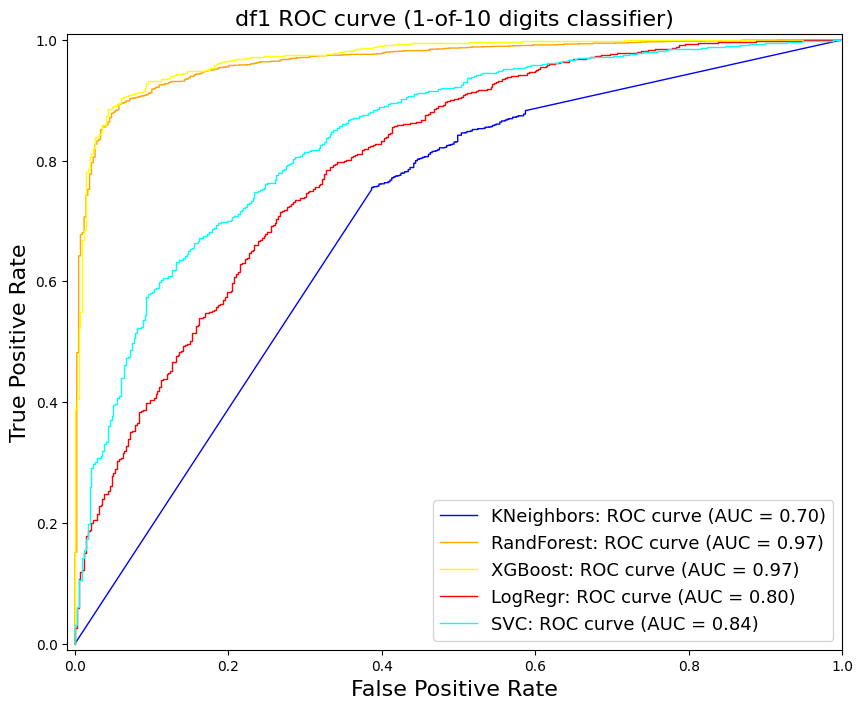

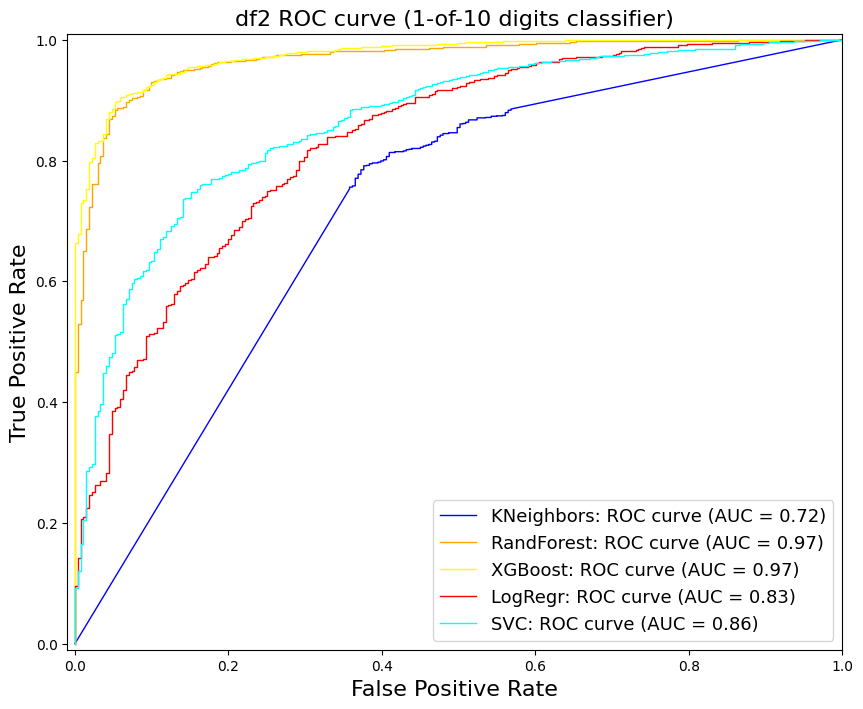

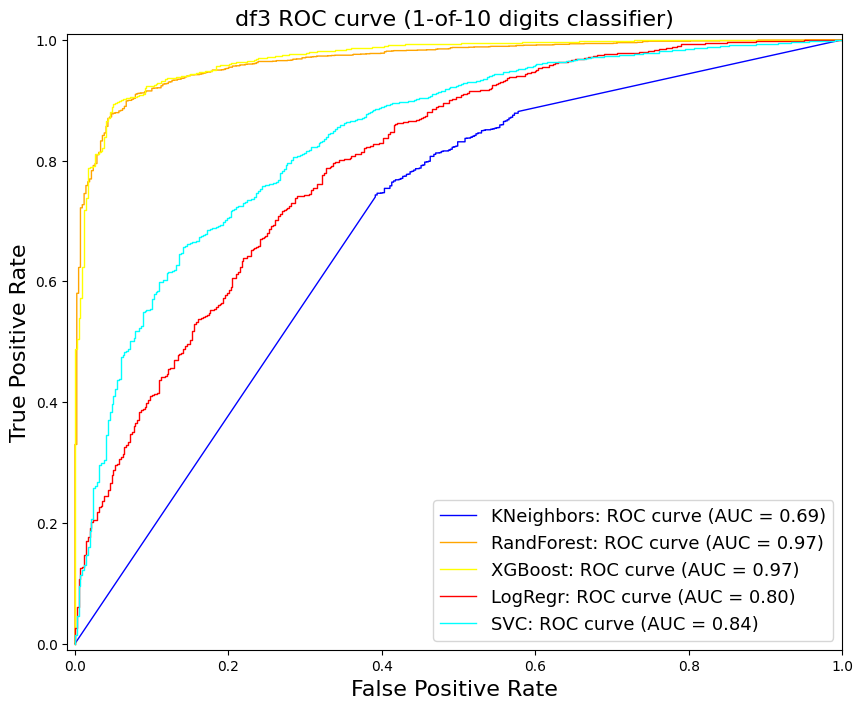

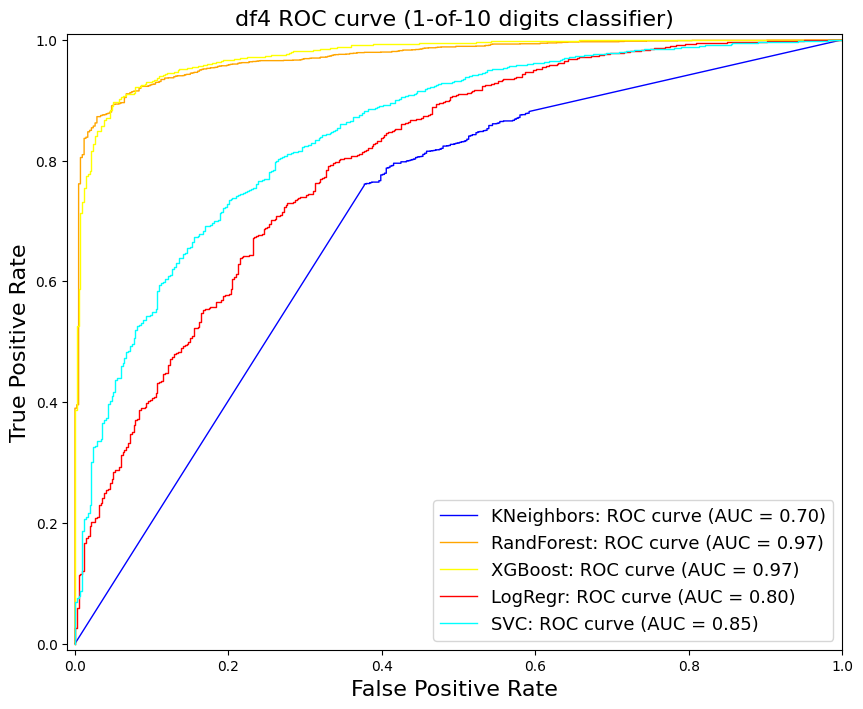

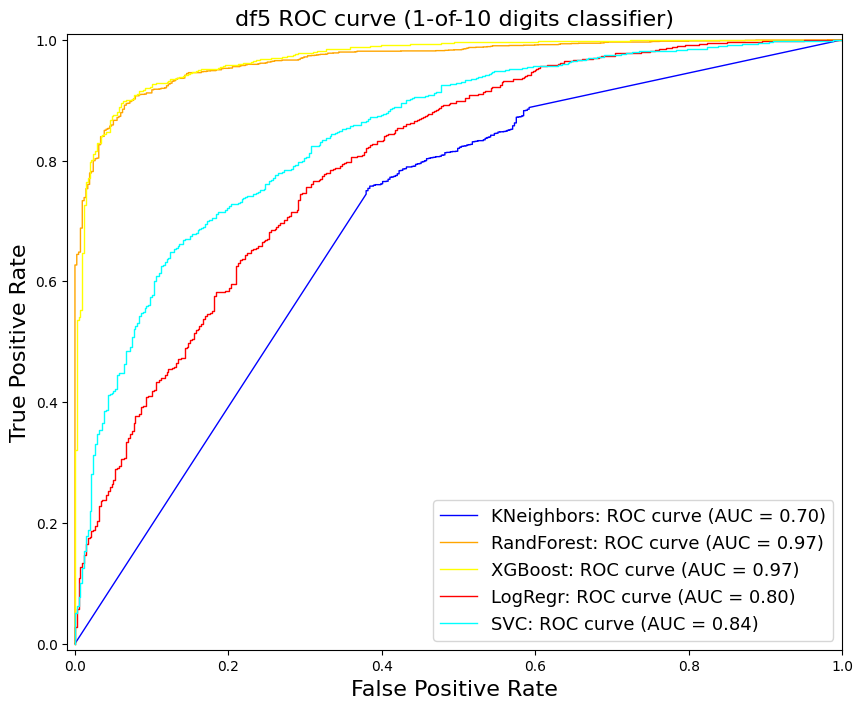

In [46]:
# 각 모델 별 ROC 커브 그리기
for i in range(1, 6):
    X_train = globals()[f'X{i}_train']
    X_test = globals()[f'X{i}_test']
    y_train = globals()[f'y{i}_train']
    y_test = globals()[f'y{i}_test']
    X_train_s_pca = globals()[f'X_train_s_pca{i}']
    X_test_s_pca = globals()[f'X_test_s_pca{i}']
    
    y_proba_knn = knn_grid.best_estimator_.fit(X_train_s_pca, y_train).predict_proba(X_test_s_pca)
    y_proba_rfc = rfc_grid.best_estimator_.fit(X_train, y_train).predict_proba(X_test)
    y_proba_xgbc = xgbc_grid.best_estimator_.fit(X_train, y_train).predict_proba(X_test)
    y_scores_logr = logr_grid.best_estimator_.fit(X_train_s_pca, y_train).decision_function(X_test_s_pca)
    y_scores_svc = svc_grid.best_estimator_.fit(X_train_s_pca, y_train).decision_function(X_test_s_pca)

    fpr_knn, tpr_knn, _ = roc_curve(y_test, y_proba_knn[:,1])
    fpr_rfc, tpr_rfc, _ = roc_curve(y_test, y_proba_rfc[:,1])
    fpr_xgbc, tpr_xgbc, _ = roc_curve(y_test, y_proba_xgbc[:,1])
    fpr_logr, tpr_logr, _ = roc_curve(y_test, y_scores_logr)
    fpr_svc, tpr_svc, _ = roc_curve(y_test, y_scores_svc)

    roc_auc_knn = auc(fpr_knn, tpr_knn)
    roc_auc_rfc = auc(fpr_rfc, tpr_rfc)
    roc_auc_xgbc = auc(fpr_xgbc, tpr_xgbc)
    roc_auc_logr = auc(fpr_logr, tpr_logr)
    roc_auc_svc = auc(fpr_svc, tpr_svc)

    plt.figure(figsize=(10, 8))
    plt.xlim([-0.01, 1.00])
    plt.ylim([-0.01, 1.01])
    plt.plot(fpr_knn, tpr_knn, lw=1, label=f'KNeighbors: ROC curve (AUC = {roc_auc_knn:.2f})', color='blue')
    plt.plot(fpr_rfc, tpr_rfc, lw=1, label=f'RandForest: ROC curve (AUC = {roc_auc_rfc:.2f})', color='orange')
    plt.plot(fpr_xgbc, tpr_xgbc, lw=1, label=f'XGBoost: ROC curve (AUC = {roc_auc_xgbc:.2f})', color='yellow')
    plt.plot(fpr_logr, tpr_logr, lw=1, label=f'LogRegr: ROC curve (AUC = {roc_auc_logr:.2f})', color='red')
    plt.plot(fpr_svc, tpr_svc, lw=1, label=f'SVC: ROC curve (AUC = {roc_auc_svc:.2f})', color='cyan')
    plt.xlabel('False Positive Rate', fontsize=16)
    plt.ylabel('True Positive Rate', fontsize=16)
    plt.title(f'df{i} ROC curve (1-of-10 digits classifier)', fontsize=16)
    plt.legend(loc='lower right', fontsize=13)
    plt.show();


#### **종합 비교 결과**
| 데이터프레임 | 모델 | AUC   |
|-------------|-------|-------|
| df1         | KNN   | 0.70  |
| -         | RFC   | 0.97  |
| -         | XGBC  | 0.97  |
| -         | LR    | 0.80  |
| -         | SVC   | 0.84  |
| df2         | KNN   | 0.72  |
| -         | RFC   | 0.97  |
| -         | XGBC  | 0.97  |
| -         | LR    | 0.83  |
| -         | SVC   | 0.86  |
| df3         | KNN   | 0.69  |
| -         | RFC   | 0.97  |
| -         | XGBC  | 0.97  |
| -         | LR    | 0.80  |
| -         | SVC   | 0.84  |
| df4         | KNN   | 0.70  |
| -         | RFC   | 0.97  |
| -         | XGBC  | 0.97  |
| -         | LR    | 0.80  |
| -         | SVC   | 0.85  |
| df5         | KNN   | 0.70  |
| -         | RFC   | 0.97  |
| -         | XGBC  | 0.97  |
| -         | LR    | 0.80  |
| -         | SVC   | 0.84  |

AUC(Area Under the ROC Curve)는 모델의 분류 성능을 나타내는 지표로, 1에 가까울수록 좋은 성능을 보입니다.

#### AUC 점수를 비교한 결과는 다음과 같습니다:

**Random Forest (RFC)** , **XGBoost (XGBC)** 모델이 모든 데이터프레임에서 높은 AUC 점수를 보였습니다.

1. Support Vector Machine (SVC) 모델도 모든 데이터프레임에서 높은 AUC 점수를 보여주었습니다.
2. Logistic Regression (LR), K-Nearest Neighbors (KNN) 모델은 모든 데이터프레임에서 RFC, XGBC, SVC 모델에 비해 상대적으로 낮은 AUC 점수를 보였습니다.

따라서 종합적으로 보았을 때, Random Forest와 XGBoost 모델이 가장 높은 AUC 점수를 보였으며, 이 모델들이 데이터프레임에 상관없이 일관된 성능을 보였습니다.

## 5. 프로젝트 요약
#### **목표**
- 신용카드 고객 이탈 예측 모델 개발
- 다양한 결측치 처리 방법을 적용하여 모델 성능 비교

#### **데이터 전처리 방법**
- df1: 최빈값 대체
- df2: 완전삭제
- df3: Hot-Deck 방법 사용
- df4: KNN 기법 사용
- df5: 결측값 사용

#### **모델 성능 비교**
- 평가 지표: 정확도, 정밀도, 재현율, F1 스코어, AUC 점수
- 사용된 모델: KNeighbors, RandomForest, XGBoost, LogisticRegression, SupportVectorMachine

#### **결과**
- 모든 데이터프레임(df1-df5)에서 XGBoost와 RandomForest가 가장 높은 성능을 보였음.
- 혼동행렬에서 정확도, 정밀도, 재현율, F1 스코어가 df2(완전삭제)에서 가장 좋은 성능을 보였음.
- 완전삭제를 통해 누락된 데이터를 처리한 경우에도 모델 성능이 유지되거나 향상되었음.

결론

프로젝트는 결측치 처리에 따른 다섯 가지 방법으로 데이터를 전처리하고, 이를 다섯 가지 모델로 평가한 것이었습니다.
누락된 데이터를 처리하는 방법은 모델 성능에 중요한 영향을 미쳤으며, 주어진 데이터에서는 완전 삭제 방법이 모델 성능을 향상시킬 수 있는 효과적인 방법임을 확인했습니다.
데이터의 전처리에 있어 여러 방법이 있지만 데이터 분석상 신중하게 조사하여 방법을 선택해야 하기에, 각 전처리 방법을 모델로 평가하여 분석할 수 있었습니다.

## 6. 서비스 기획
위의 방법으로 선택된 df2(완전삭제) 데이터와 XGBoost 모델을 활용하여 어떤 요소가 고객의 이탈률에 얼마나 영향을 끼쳤는지를 확인하여 신용카드 회사의 서비스를 개선하고자 합니다.

/Users/parkyunsu/anaconda3/envs/credit/lib/python3.8/site-packages/xgboost/core.py:160: UserWarning:

[13:59:17] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:742: 
Parameters: { "model__learning_rate", "model__max_delta_step", "model__max_depth" } are not used.




<Figure size 1000x600 with 0 Axes>

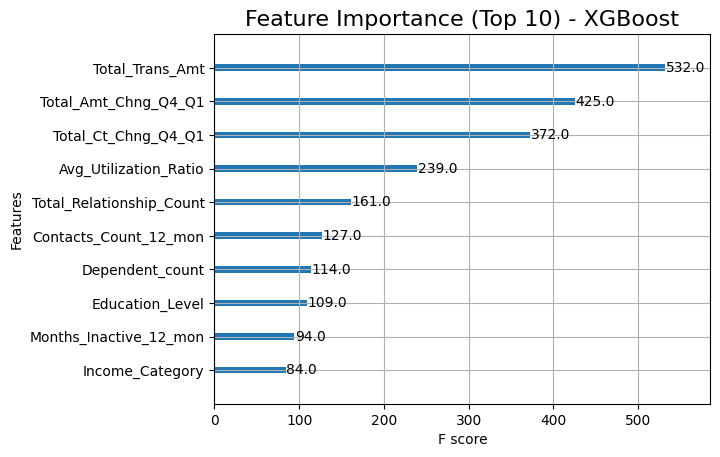

In [79]:
import xgboost as xgb

# XGBoost 모델 재학습
xgbc_best = xgb.XGBClassifier(**xgbc_grid.best_params_)
xgbc_best.fit(X2_train, y2_train)

# Feature Importance 시각화
plt.figure(figsize=(10, 6))
xgb.plot_importance(xgbc_best, max_num_features=10)
plt.title("Feature Importance (Top 10) - XGBoost", fontsize=16)
plt.show()


특성 중요도 결과

| 순위 | 특성 이름                  | 중요도 |
|------|----------------------------|-------|
| 1    | Total_Trans_Amt            | 532   |
| 2    | Total_Amt_Chng_04_Q1      | 425   |
| 3    | Total_Ct_Chng_Q4_Q1       | 372   |
| 4    | Avg_Utilization_Ratio      | 239   |
| 5    | Total_Relationship_Count  | 161   |
| 6    | Contacts_Count_12_mon     | 127   |
| 7    | Dependent_count           | 114   |
| 8    | Education_Level           | 109   |
| 9    | Months_Inactive_12_mon    | 94    |
| 10   | Income_Category           | 84    |

In [99]:
import shap
explainer = shap.TreeExplainer(xgbc_best)
shap_values = explainer.shap_values(X2_train)
shap.initjs()
shap.force_plot(
    explainer.expected_value,
    shap_values,
    X2_train,
    feature_names=X2_train.columns
)

shap.plots.force is slow for many thousands of rows, try subsampling your data.


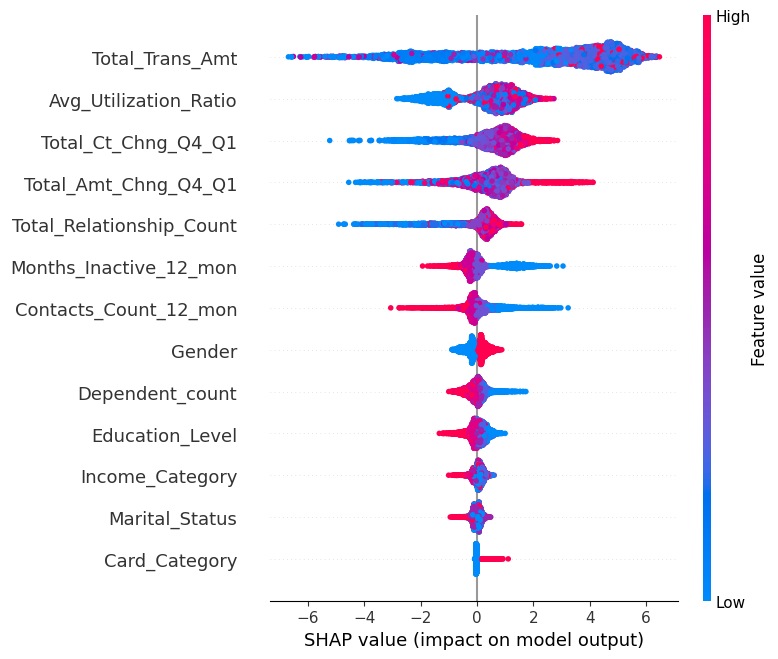

In [102]:
shap.summary_plot(shap_values, X2_train)

#### **해석**

**1. Total_Trans_Amt (총 거래 금액):**

가장 높은 중요도를 가진 특성으로, 고객의 총 거래 금액이 신용카드 이탈률에 가장 큰 영향을 미칩니다. 거래 금액이 높을수록 이탈 가능성이 낮아질 수 있습니다.


**2. Total_Amt_Chng_04_Q1 (1분기 대비 총 거래 금액 변동):**

1분기 대비 총 거래 금액의 변동이 두 번째로 높은 중요도를 가집니다. 이것은 최근 거래 활동의 변화가 이탈 가능성에 미치는 영향을 나타냅니다.


**3. Total_Ct_Chng_Q4_Q1 (4분기 대비 총 거래 건수 변동):**

4분기 대비 총 거래 건수의 변동이 세 번째로 높은 중요도를 가집니다. 이것은 최근 거래 활동의 변화가 이탈 가능성에 미치는 영향을 나타냅니다.

**4. Avg_Utilization_Ratio (평균 카드 이용률):**
 
평균 카드 이용률로 예를들어 카드 사용금액이 1,000 , 카드 한도 5,000 이면 이용률은 20%로 이다(계산방법 Total_Revolving_Bal / Credit_Limit *100)

신용카드의 평균 이용률이 이탈률에 미치는 영향을 나타냅니다. 이용률이 높을 수록 이탈 가능성이 낮아질 수 있습니다.


**5. Total_Relationship_Count (카드 보유 수):**


고객의 카드 보유 수가 많을수록 이탈할 가능성이 낮아질 수 있습니다.

### **제공 서비스**

#### **1. 고객에게 맞춤형 혜택 제공:**
고객의 총 거래 금액이 매우 중요한 요소임을 고려할 때, 총 거래 금액에 따라 다양한 등급의 혜택을 제공할 수 있습니다.
총 거래 금액에 따라 적립되는 포인트나 현금 환급, 할인 혜택 등을 제공하여 고객들에게 맞춤형 혜택을 제공할 수 있습니다.


#### **2. 거래 활동에 따른 개인화된 마케팅 전략 구성:**
거래 활동 변동 및 총 거래 건수 변동이 이탈 가능성에 큰 영향을 미친다는 것을 고려하여, 고객의 거래 활동에 따른 개인화된 마케팅 전략을 구성할 수 있습니다.
최근 거래 활동이 감소하는 고객에게는 특별한 혜택이나 할인을 제공하여 활동을 유도할 수 있습니다.



#### **3. 고객들 신용 한도를 증가시키기:**

카드 이용률 관리 및 교육 프로그램 제공:
평균 카드 이용률이 이탈 가능성에 큰 영향을 미친다는 것을 고려하여, 카드 이용률을 적절히 관리하는 것이 중요합니다.
카드 이용률을 적절히 관리할 수 있는 교육 프로그램을 제공하거나, 카드 이용률이 높은 고객에게는 더 높은 신용 한도를 부여함으로써 해당 고객 그룹이 조직을 떠나는 가능성을 낮출 수 있을 것입니다.

#### **4. 신규 고객 유치를 위한 마케팅 전략:**
카드 보유 수가 이탈 가능성에 영향을 미친다는 것을 고려하여, 신규 고객 유치를 위한 마케팅 전략을 구성할 수 있습니다.
새로운 고객을 유치하기 위해 혜택이나 프로모션을 제공하고, 이를 통해 고객들을 계속 유지하도록 유도할 수 있습니다.